#Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/My Drive/MSBA/BT5153/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/MSBA/BT5153


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import os
import re
import xgboost as xgb

from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer

from sklearn.preprocessing import StandardScaler

from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline  # Import Pipeline from imblearn
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFE, RFECV
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_fscore_support

import warnings
warnings.filterwarnings("ignore")

import time
import random
import lime
import lime.lime_tabular
import json
import matplotlib.pyplot as plt


In [ ]:
raw_data = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
raw_data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [ ]:
df = raw_data.copy(deep=True)

# EDA

## basic checks for:
1. null values
2. duplicate values
3. categorical and numerical columns
4. columns that are statistically insignificant i.e. only contains one value

In [ ]:
# no null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [ ]:
# no dupes
df.duplicated().sum()

0

In [ ]:
for col in df.columns:
  print(col, df[col].unique())

# takeaways
# num cols
  # Age
  # DailyRate
  # HourlyRate -> check for corr with all rate variables
  # MonthlyIncome
  # MonthlyRate
  # DistFromHome
  # NumOfCompaniesWorked
  # PercentSalaryHike
  # TotalWorkingYears
  # TrainingTimesLastYear
  # YearsAtCompany
  # YearsInCurrentRole
  # YearsSinceLastPromotion
  # YearsWithCurrManager

# cat cols
  # BusinessTravel (ord)
  # Department (cat)
  # Education (ord)
  # EducationField (cat)
  # EnvironmentSatisfaction (ord)
  # Gender (cat)
  # Jobinvolvement (ord)
  # JobLevel (ord)
  # JobRole (cat)
  # JobSatisfaction (ord)
  # MaritalStatus (cat)
  # Overtime (cat)
  # PerformanceRating -> only (3,4), (ord)
  # RelationshipSatisfaction (ord)
  # StockOptionLevel (ord)
  # WorkLifeBalance (ord)

# target col = attrition
# ===

# drop col that either only contain 1 value or all distinct values
  # EmployeeCount
  # EmployeeNumber i.e. id
  # Over18
  # StandardHours

Age [41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]
Attrition ['Yes' 'No']
BusinessTravel ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
DailyRate [1102  279 1373 1392  591 1005 1324 1358  216 1299  809  153  670 1346
  103 1389  334 1123 1219  371  673 1218  419  391  699 1282 1125  691
  477  705  924 1459  125  895  813 1273  869  890  852 1141  464 1240
 1357  994  721 1360 1065  408 1211 1229  626 1434 1488 1097 1443  515
  853 1142  655 1115  427  653  989 1435 1223  836 1195 1339  664  318
 1225 1328 1082  548  132  746  776  193  397  945 1214  111  573 1153
 1400  541  432  288  669  530  632 1334  638 1093 1217 1353  120  682
  489  807  827  871  665 1040 1420  240 1280  534 1456  658  142 1127
 1031 1189 1354 1467  922  394 1312  750  441  684  249  841  147  528
  594  470  957  542  802 1355 1150 1329  959 1033 1316  364  438  689
  201 1427  857  933 1181 1395  662 1436  194  967 1496

In [ ]:
# we dropped these statistically insignificant columns because:
# 1. EmployeeCount: only contains one value "1"
# 2. EmployeeNumber: 1470 distinct
# 3. Over18: contains one value "Y"
# 4. StandardHours: contains one value "80"


df.drop(["EmployeeCount", "EmployeeNumber", "Over18", "StandardHours"], axis=1, inplace=True)

In [ ]:
# define all the diff types of cols
num_cols = ["Age", "MonthlyIncome", "DistanceFromHome", 
            #"DailyRate", "HourlyRate", "MonthlyRate", 
            "NumCompaniesWorked", "PercentSalaryHike", "TotalWorkingYears", "TrainingTimesLastYear",
            "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager"
            ]

cat_cols = ["Department", "EducationField", "Gender",
            "JobRole", "MaritalStatus", "OverTime"
            ]

ord_cols = ["BusinessTravel", "Education", "EnvironmentSatisfaction",
            "JobInvolvement", "JobLevel", "JobSatisfaction",
            "StockOptionLevel", "WorkLifeBalance", "RelationshipSatisfaction"
            ]

## General EDA 

In [ ]:
# statistical sumaary of the dataset
df.describe()

# doesnt look like there are any anomalies

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [ ]:
df[df.Attrition=="Yes"].describe()

# mean age of employees that left are lower
# environment satisfaction of attrited

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,...,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000,237.000000
mean,33.607595,750.362869,10.632911,2.839662,2.464135,65.573840,2.518987,1.637131,2.468354,4787.092827,...,3.156118,2.599156,0.527426,8.244726,2.624473,2.658228,5.130802,2.902954,1.945148,2.852321
std,9.689350,401.899519,8.452525,1.008244,1.169791,20.099958,0.773405,0.940594,1.118058,3640.210367,...,0.363735,1.125437,0.856361,7.169204,1.254784,0.816453,5.949984,3.174827,3.153077,3.143349
min,18.000000,103.000000,1.000000,1.000000,1.000000,31.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,408.000000,3.000000,2.000000,1.000000,50.000000,2.000000,1.000000,1.000000,2373.000000,...,3.000000,2.000000,0.000000,3.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
50%,32.000000,699.000000,9.000000,3.000000,3.000000,66.000000,3.000000,1.000000,3.000000,3202.000000,...,3.000000,3.000000,0.000000,7.000000,2.000000,3.000000,3.000000,2.000000,1.000000,2.000000
75%,39.000000,1092.000000,17.000000,4.000000,4.000000,84.000000,3.000000,2.000000,3.000000,5916.000000,...,3.000000,4.000000,1.000000,10.000000,3.000000,3.000000,7.000000,4.000000,2.000000,5.000000
max,58.000000,1496.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19859.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,15.000000,15.000000,14.000000


In [ ]:
df[df.Attrition=="No"].describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,...,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000,1233.000000
mean,37.561233,812.504461,8.915653,2.927007,2.771290,65.952149,2.770479,2.145985,2.778589,6832.739659,...,3.153285,2.733982,0.845093,11.862936,2.832928,2.781022,7.369019,4.484185,2.234388,4.367397
std,8.888360,403.208379,8.012633,1.027002,1.071132,20.380754,0.692050,1.117933,1.093277,4818.208001,...,0.360408,1.071603,0.841985,7.760719,1.293585,0.681907,6.096298,3.649402,3.234762,3.594116
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1051.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,31.000000,477.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,3211.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,817.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,5204.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,6.000000,3.000000,1.000000,3.000000
75%,43.000000,1176.000000,13.000000,4.000000,4.000000,83.000000,3.000000,3.000000,4.000000,8834.000000,...,3.000000,4.000000,1.000000,16.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,38.000000,6.000000,4.000000,37.000000,18.000000,15.000000,17.000000


### Univariate analysis

<Figure size 2000x1000 with 0 Axes>

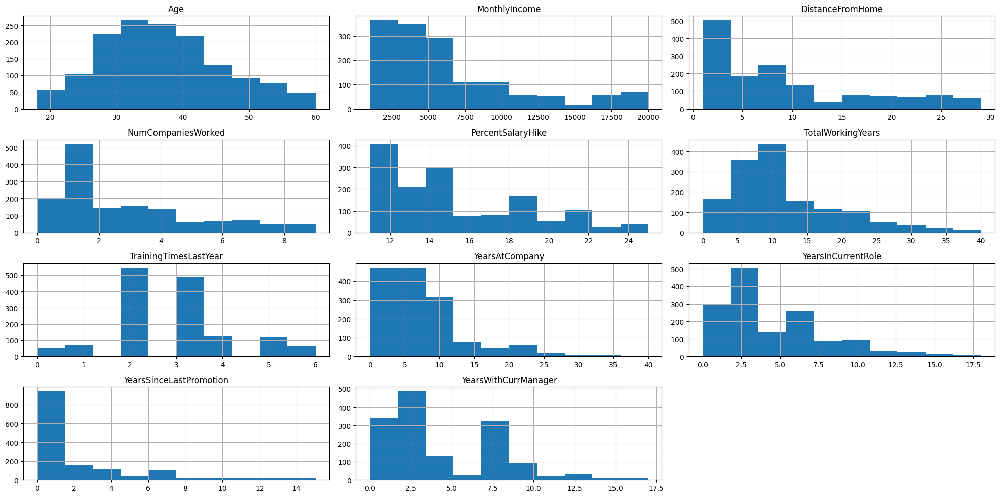

In [ ]:
# lets look at some distribution plots
# no need for boxplots since we dont have outliers

plt.figure(figsize=(20,10))
df[num_cols].hist(figsize=(20,10))
plt.tight_layout();

# age is normally distributed with a slight skew towards the younger side
# income is heavily skewed towards the lower income which is not uncommon for many companies

### Target variable

In [ ]:
df.Attrition.value_counts(normalize=False)

No     1233
Yes     237
Name: Attrition, dtype: int64

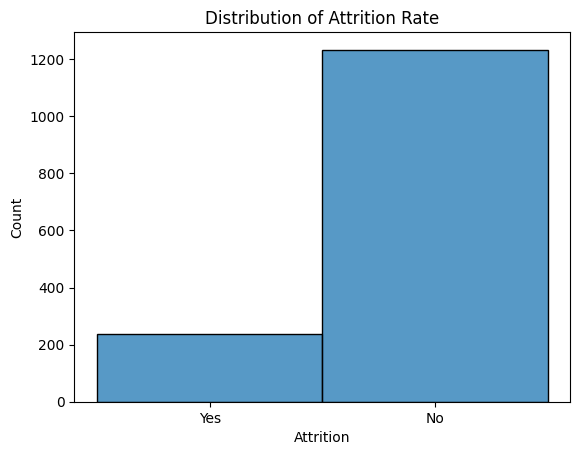

In [ ]:
sns.histplot(data=df, x="Attrition", stat='count').set_title('Distribution of Attrition Rate')
plt.ylabel('Count');

#we have an imbalanced dataset at around a 16-84 positive to negative class split

## Bivariate Analysis

### Bivariate analysis of numerical cols

In [ ]:
def plot_univar(df,col):
  plt.figure(figsize=(8,5))
  sns.histplot(data=df, x=col,hue="Attrition", stat='percent').set_title(f'Distribution of {col}')
  #plt.ylabel('Count')
  plt.xticks(rotation=45);

  #print(df.groupby('Attrition').mean()[col])

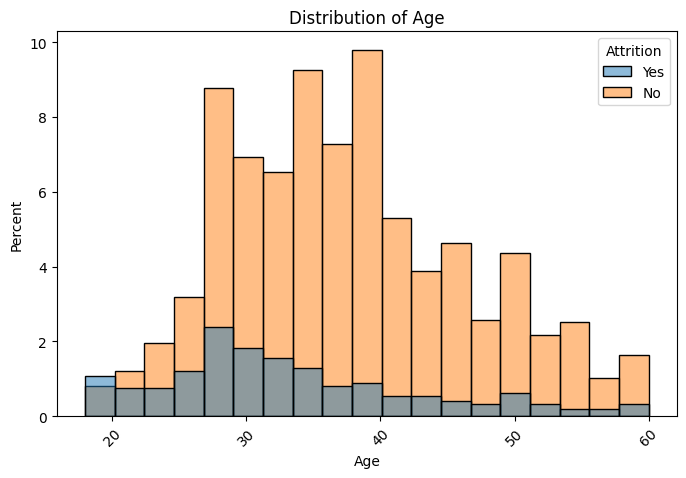

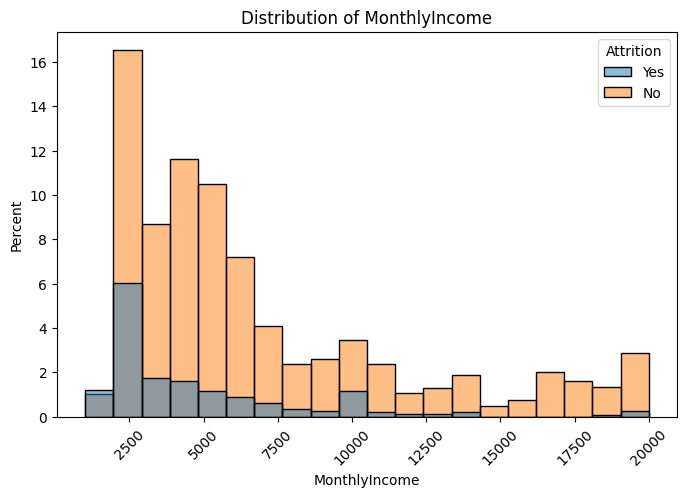

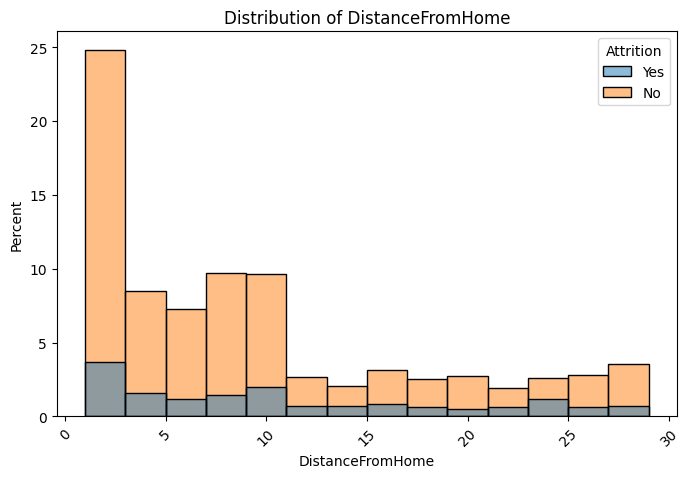

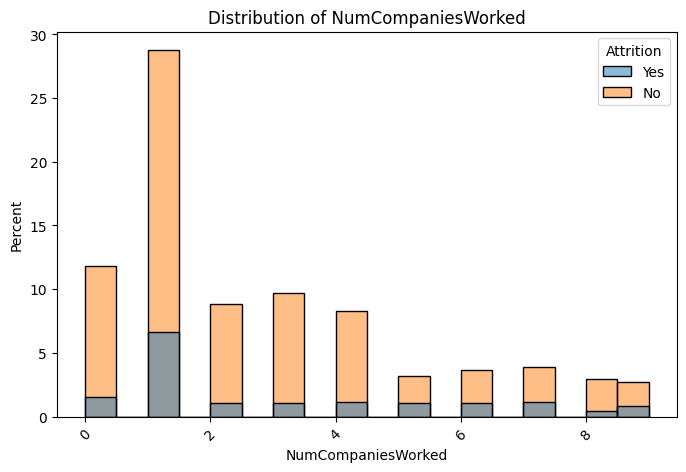

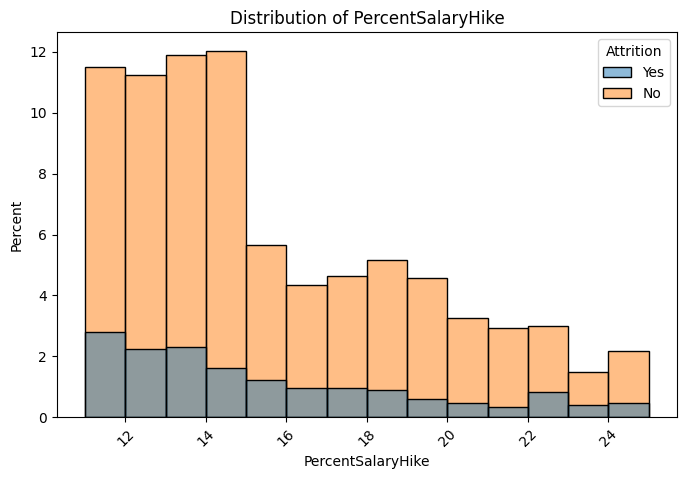

...

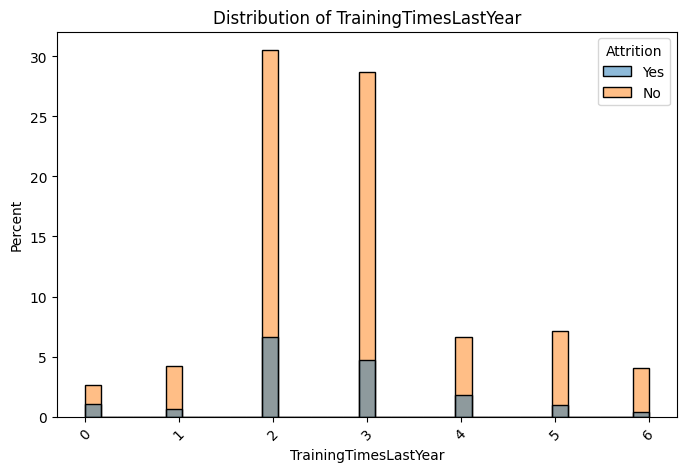

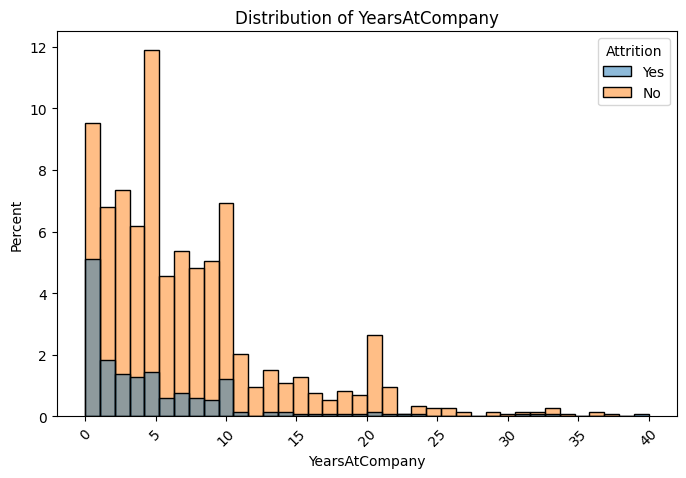

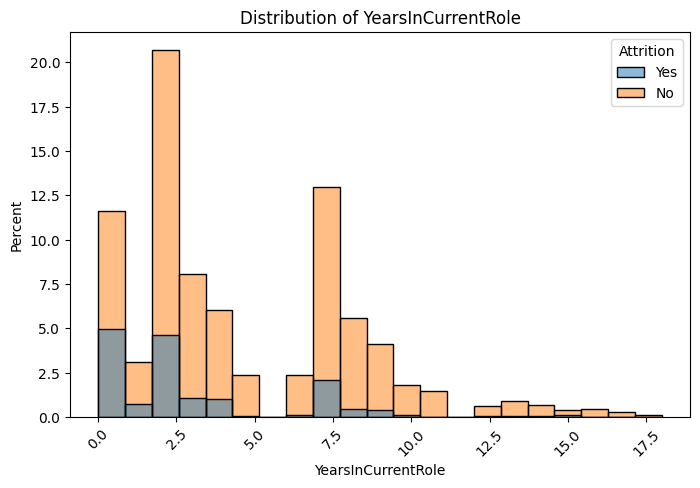

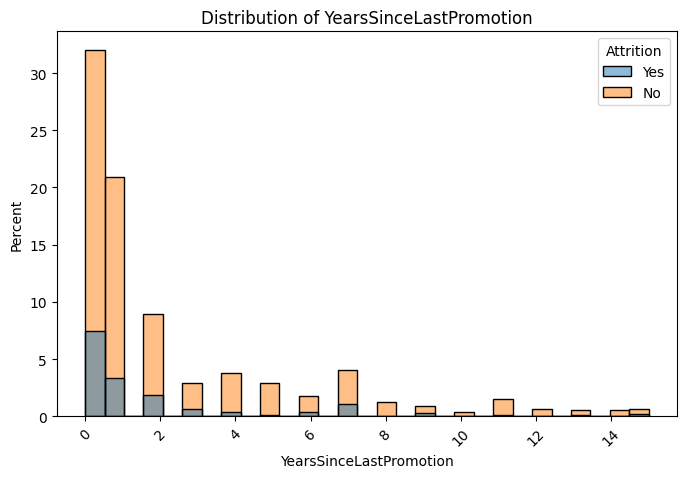

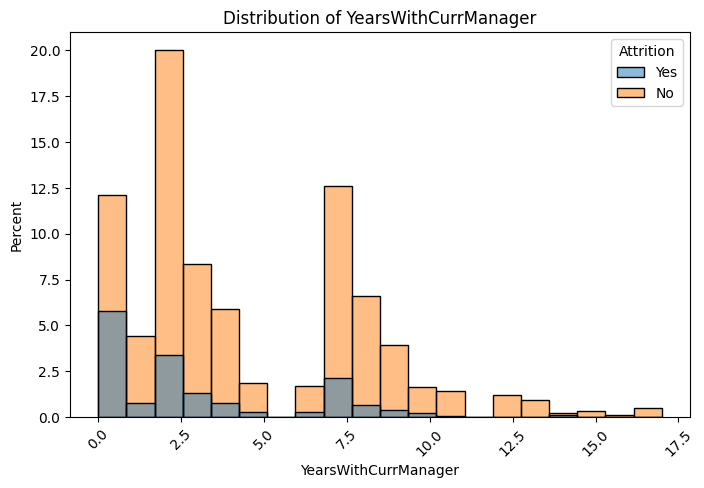

In [ ]:
# univariate analysis of num cols
import warnings
warnings.filterwarnings('ignore')

for col in num_cols:
  plot_univar(df, col)

# key suspicions:
# 1. younger people/in early parts of career/singles have higher attrition rates
# 2. lower income have v high probability of leaving


# observations
# 1. percentage salary hikes seem to have no bearing on attrition rate
# 2. amount of training does not affect attrition rate

### Bivariate analysis of categorical variables

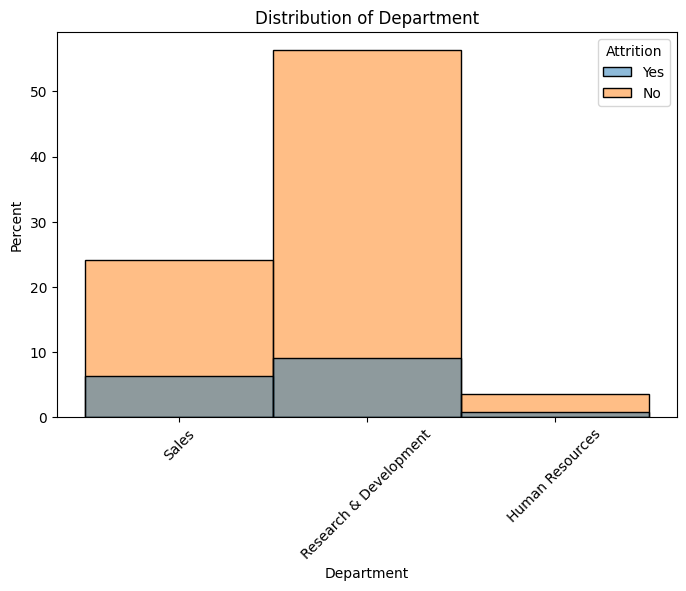

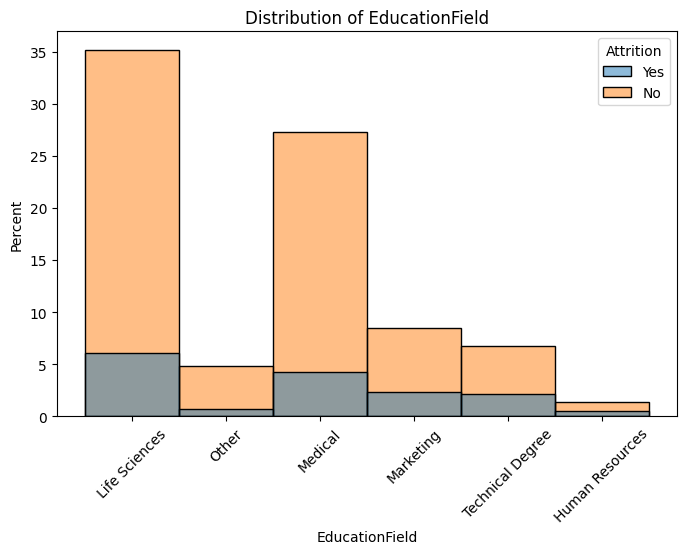

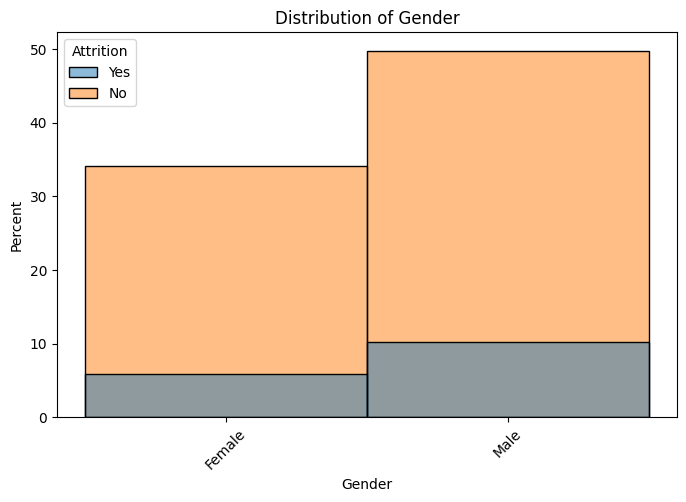

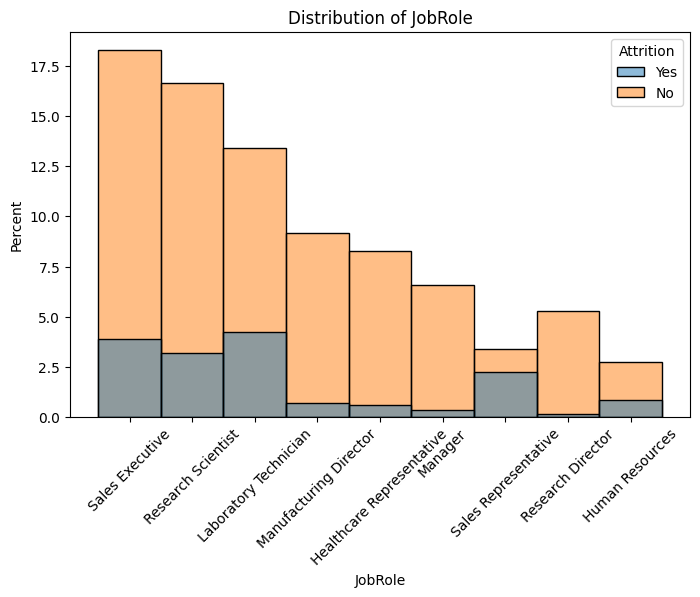

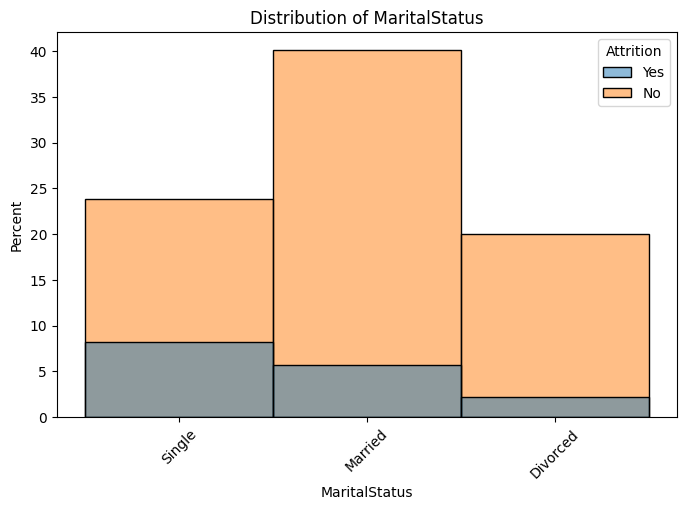

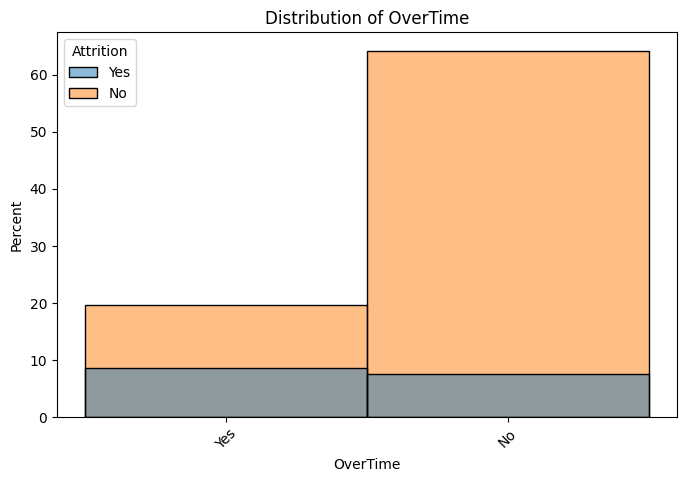

In [ ]:
# univariate analysis of cat cols
import warnings
warnings.filterwarnings('ignore')

for col in cat_cols:
  plot_univar(df, col)

# high attrition rates amongst sales people (1/3 in sales vs 1/5 in R&D)

### Bivariate analysis of ordinal cols

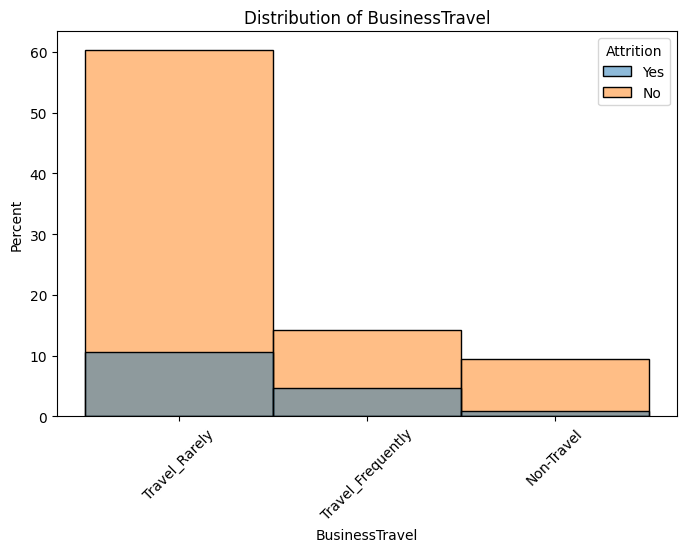

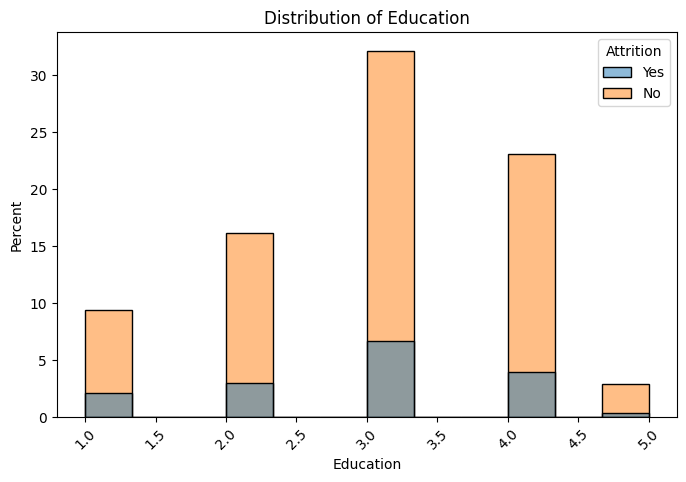

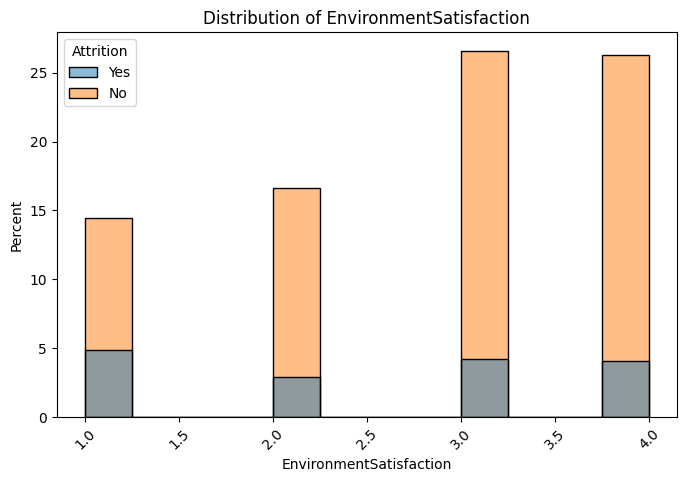

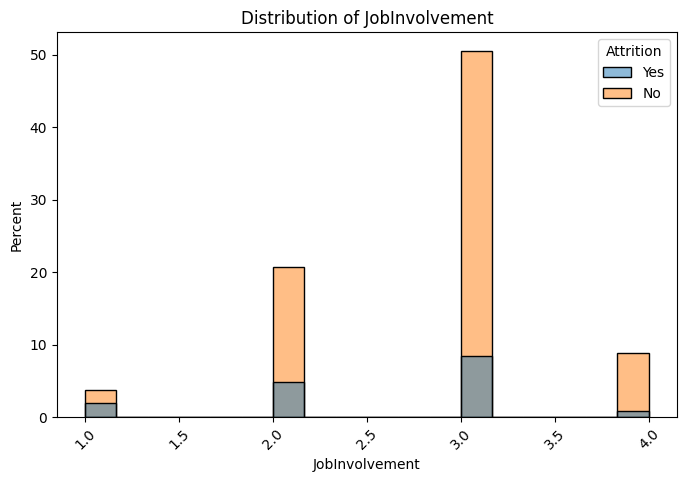

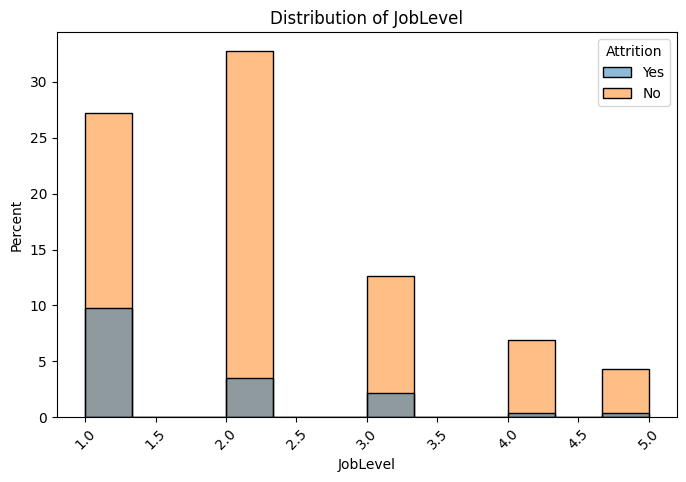

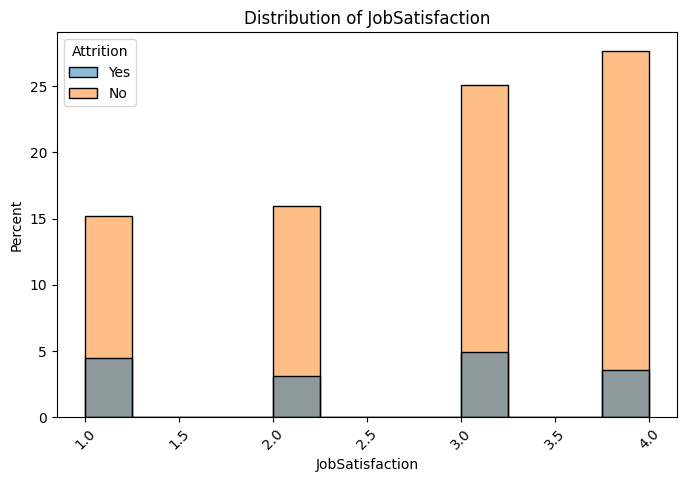

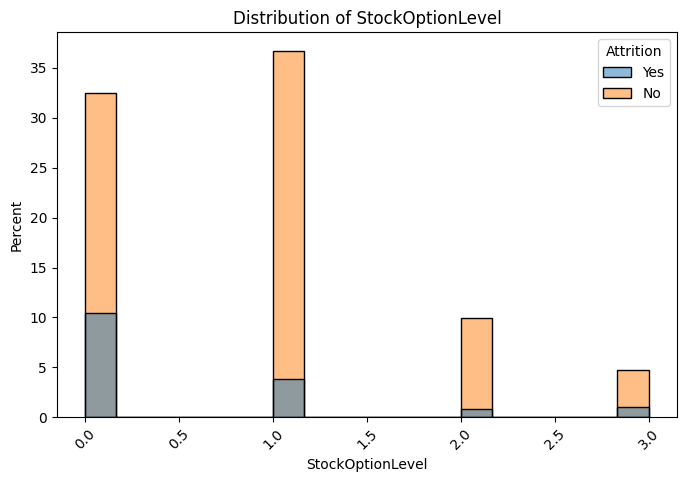

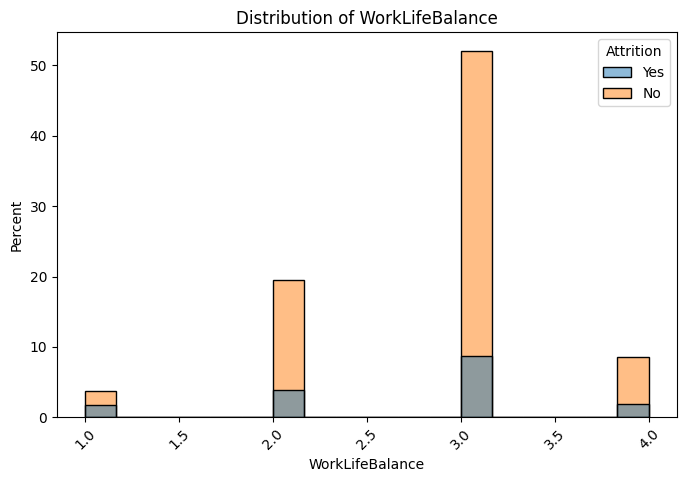

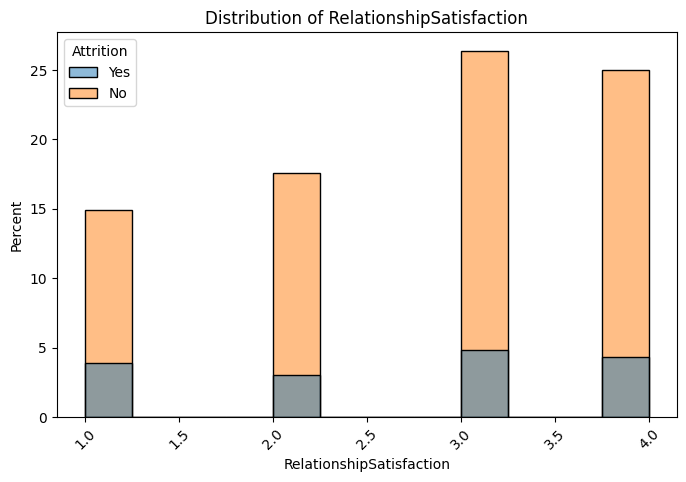

In [ ]:
# univariate analysis of ord cols
import warnings
warnings.filterwarnings('ignore')

for col in ord_cols:
  plot_univar(df, col)

## Multivariate analysis

### num vs cat

In [ ]:
def plot_bivar_box(df,x,y):
  plt.figure(figsize=(8,5))
  sns.boxplot(data=df, x=x, y=y, hue="Attrition", palette='Blues')
  plt.xticks(rotation=45);

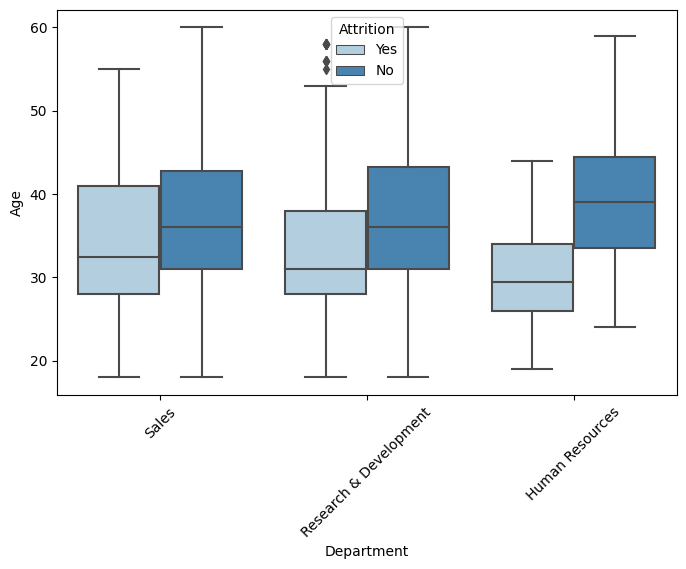

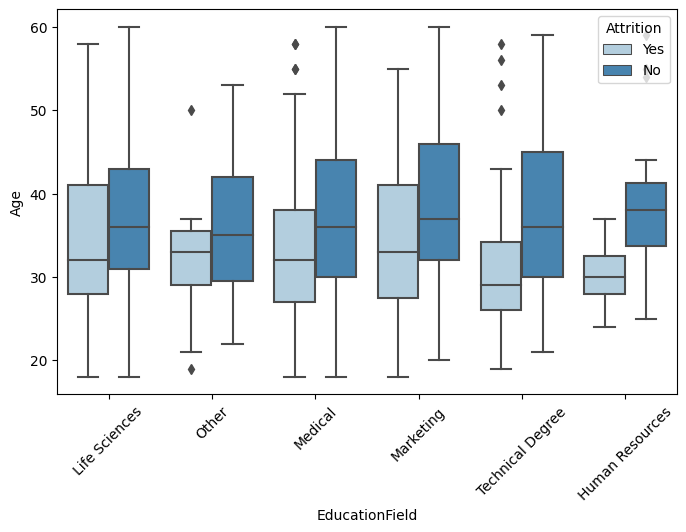

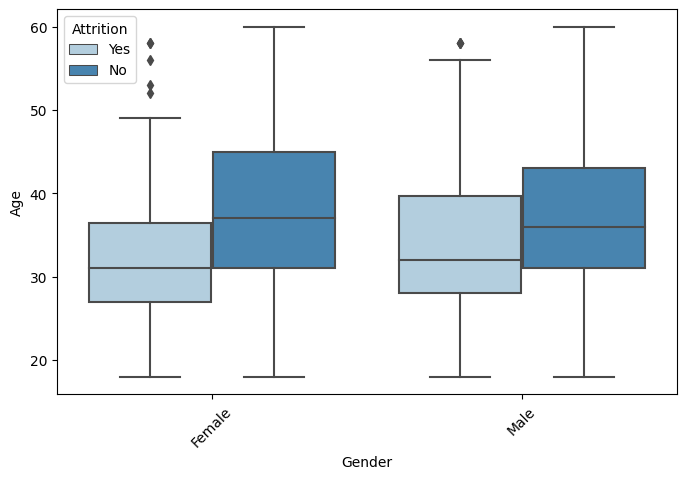

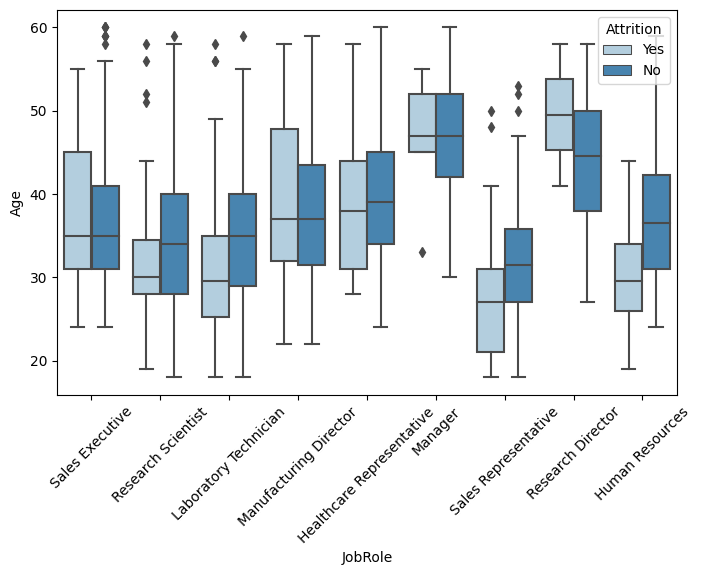

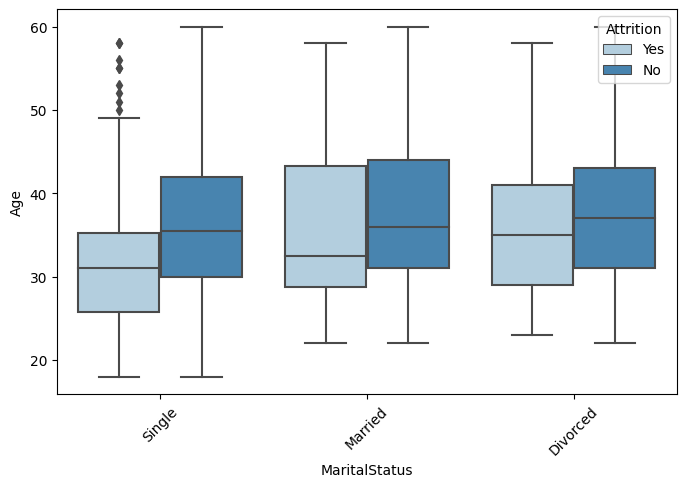

...

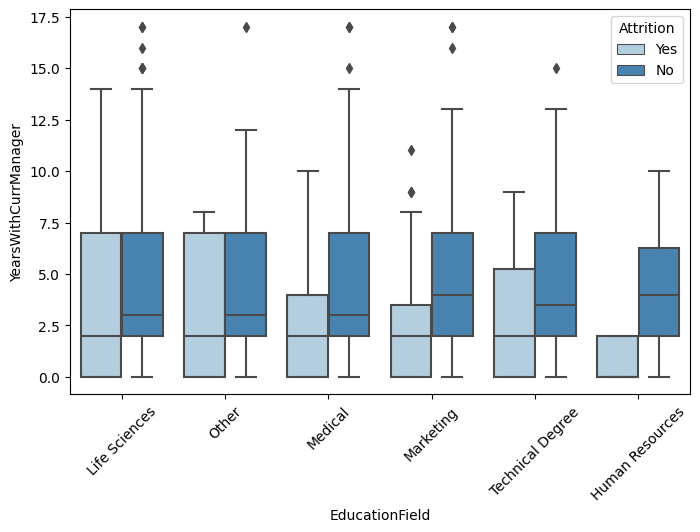

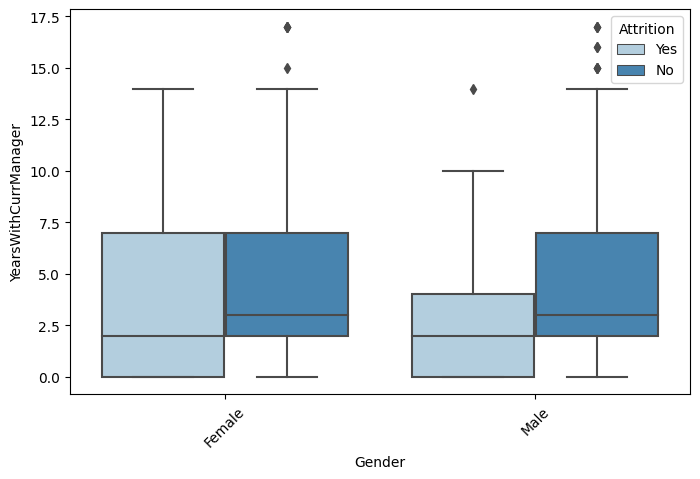

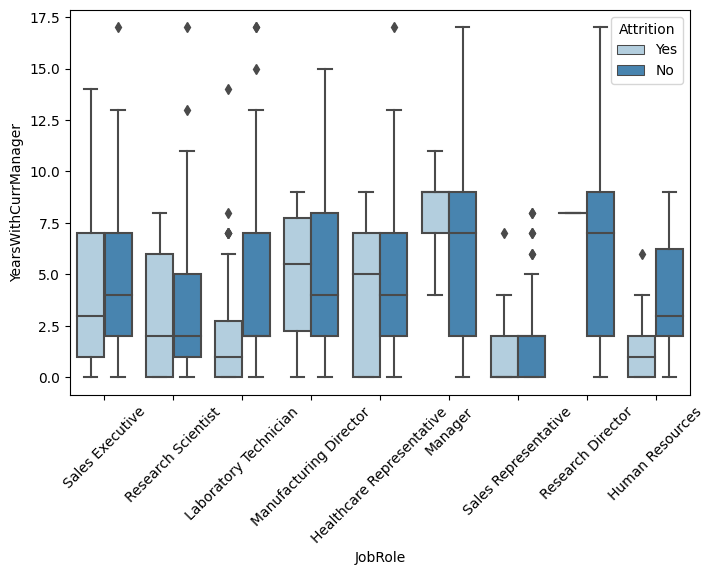

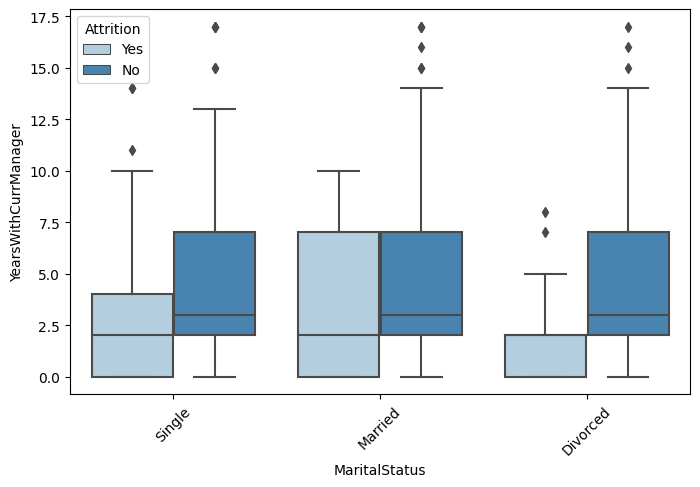

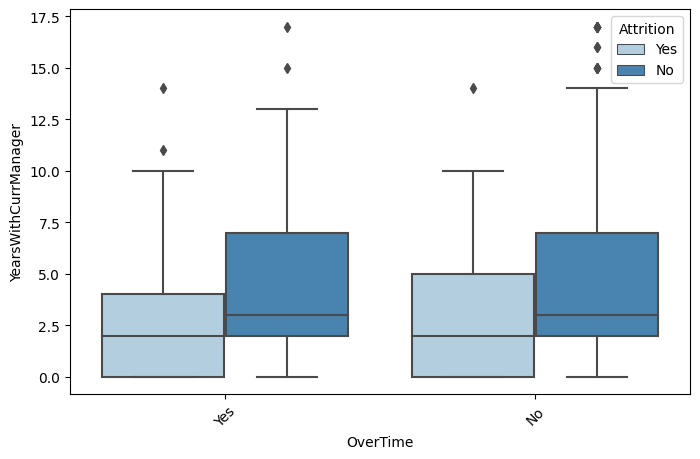

In [ ]:
for y in num_cols:
  for x in cat_cols:
    plot_bivar_box(df, x, y);


# at high level, manager/director level attrition seems to no longer be about money

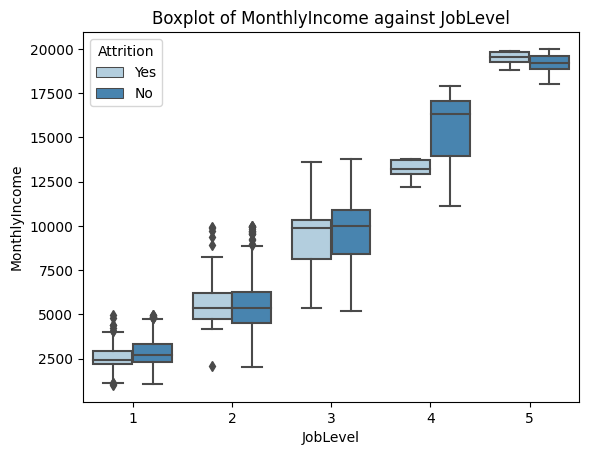

In [ ]:
# this shows that attrition rate is not about overtime
sns.boxplot(data=df, x="JobLevel", y="MonthlyIncome", hue="Attrition", palette="Blues").set_title(f'Boxplot of MonthlyIncome against JobLevel');

### num vs ord

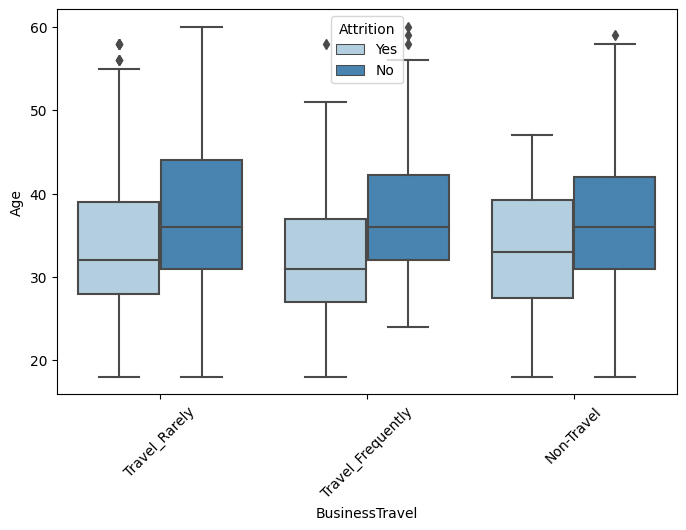

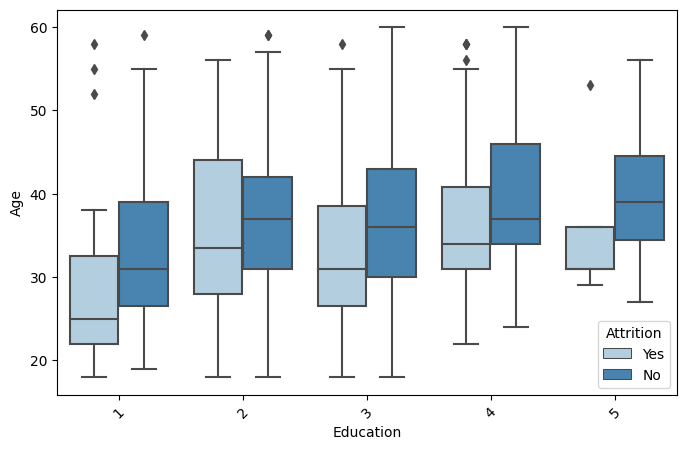

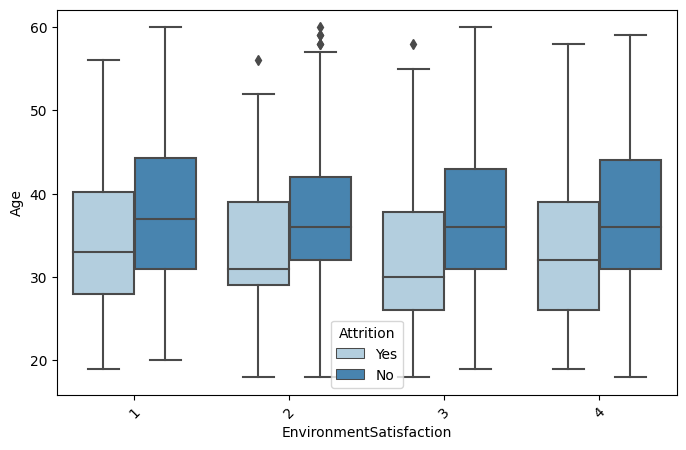

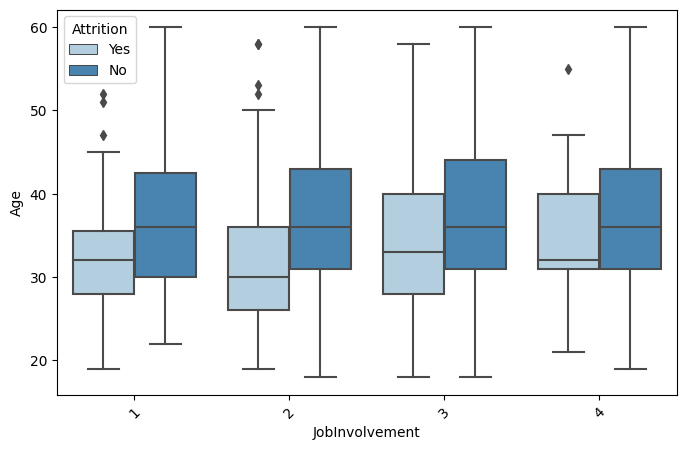

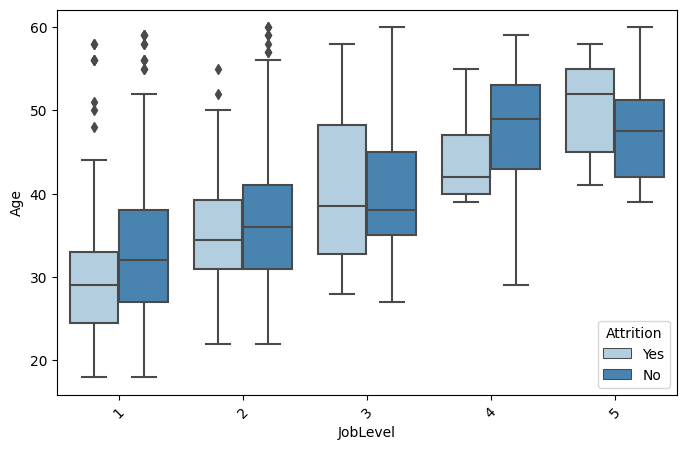

...

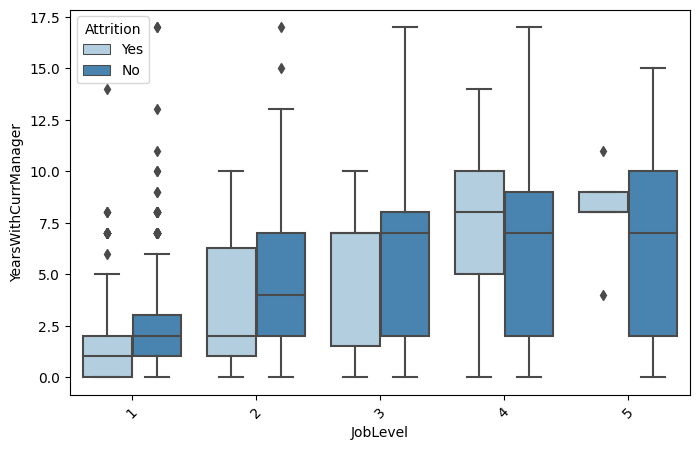

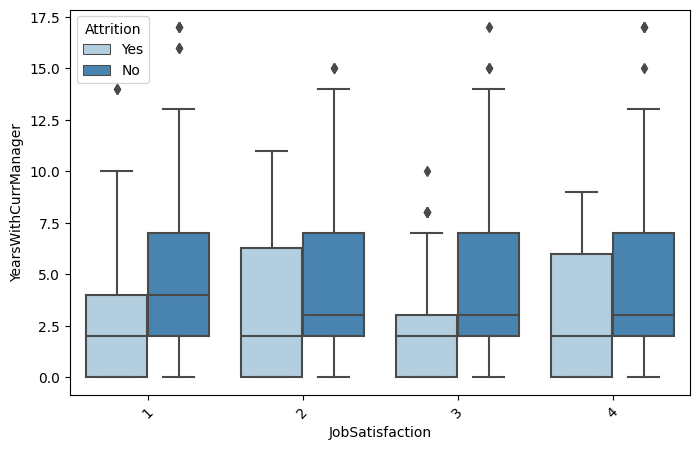

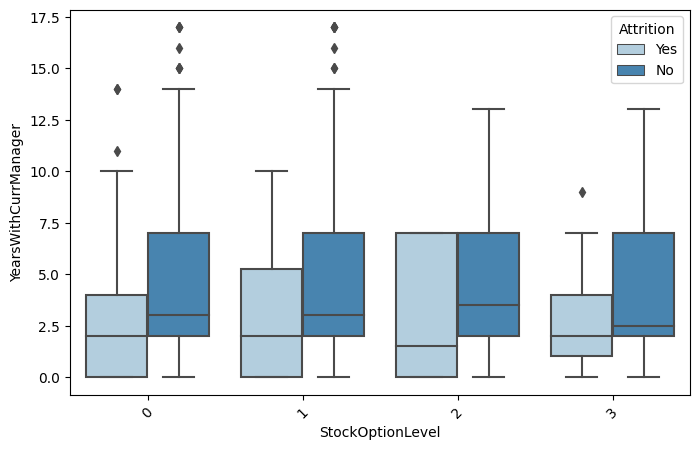

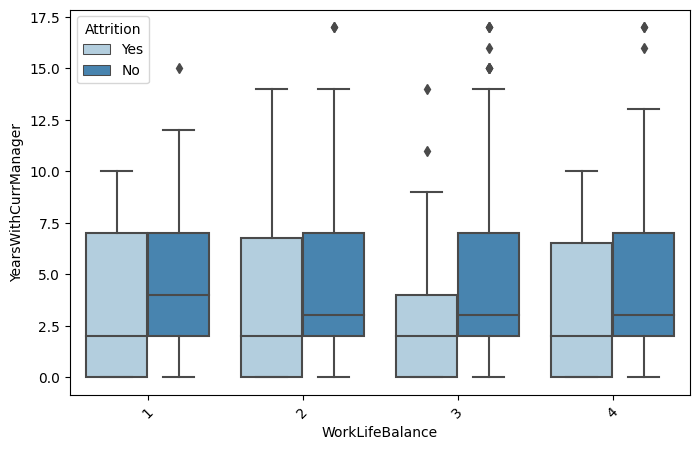

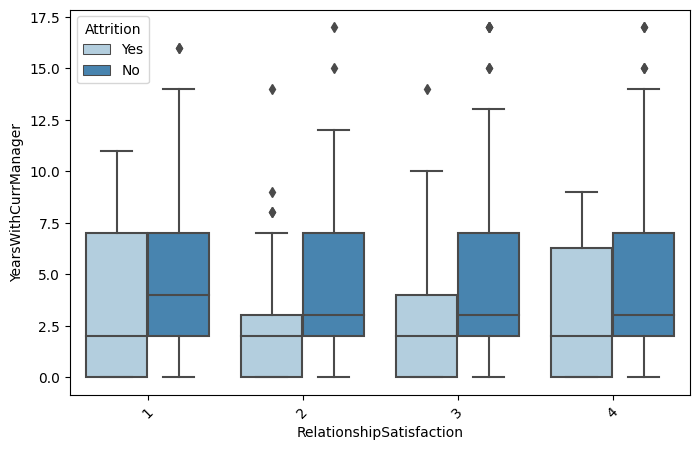

In [ ]:
for y in num_cols:
  for x in ord_cols:
    plot_bivar_box(df, x, y);

#no. of training times is on average between 2 and 3 times across all conditions -> likely to be 

### num vs num

In [ ]:
def plot_bivar_num(df,x,y):
  plt.figure(figsize=(8,5))
  sns.scatterplot(data=df, x=x, y=y, hue="Attrition")
  plt.xticks(rotation=45);

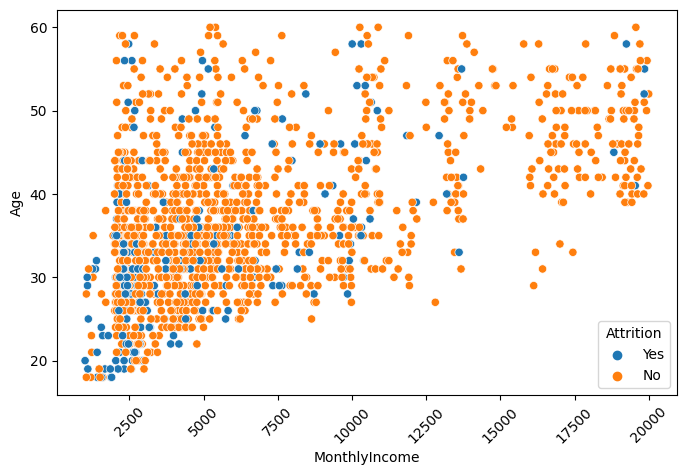

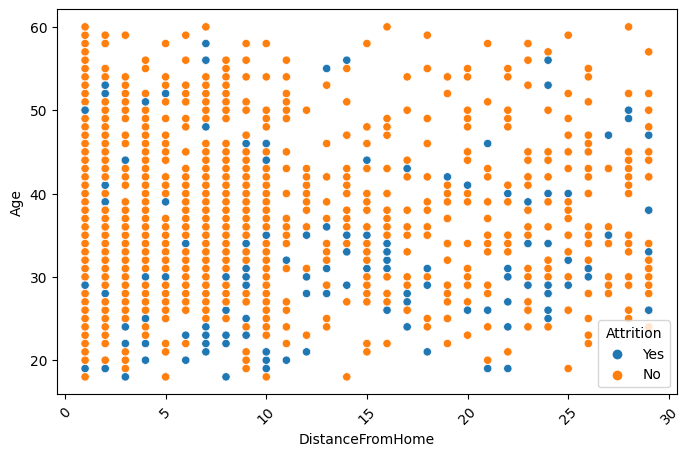

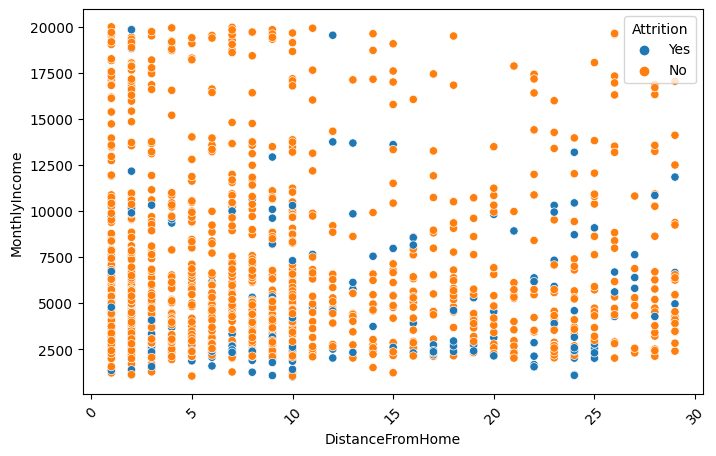

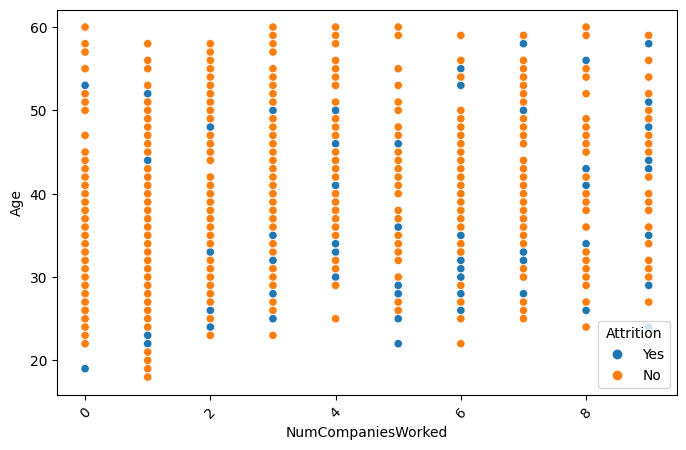

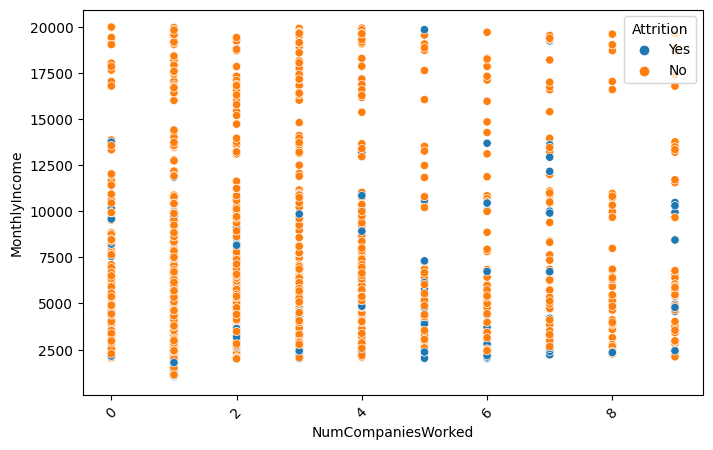

...

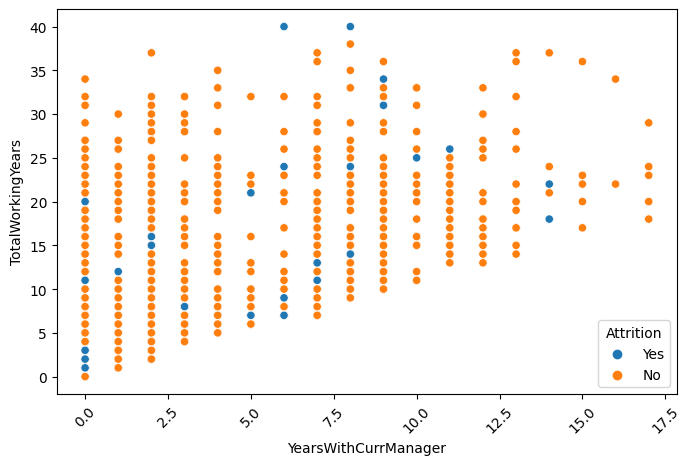

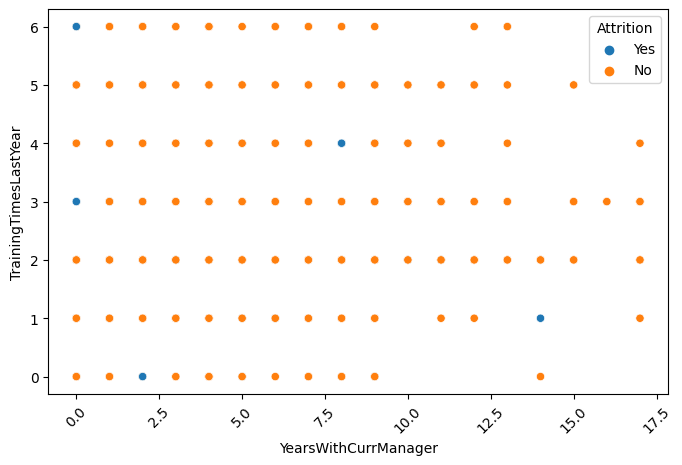

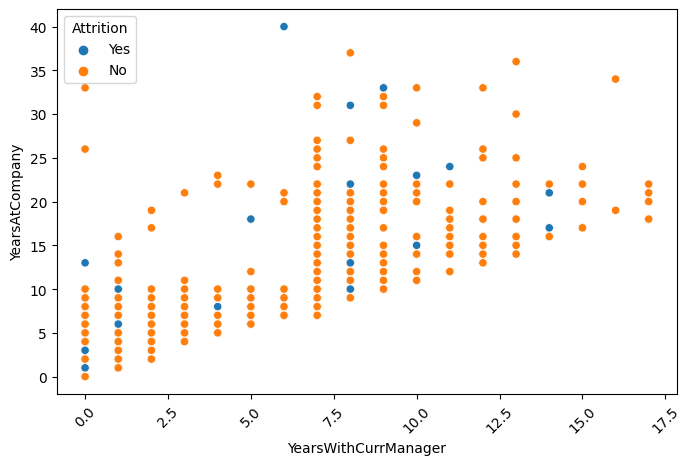

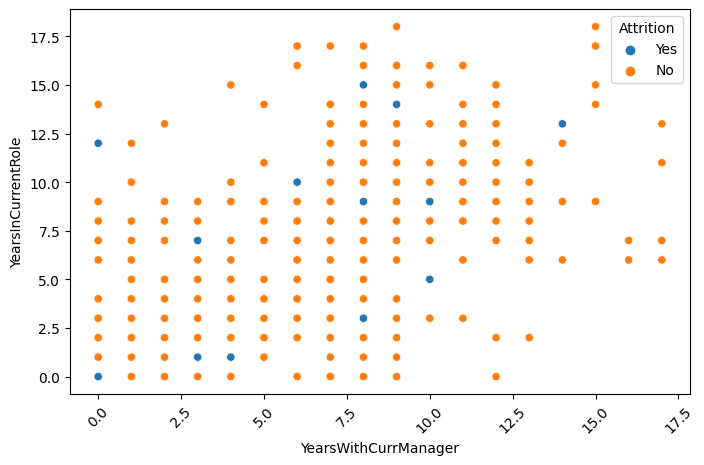

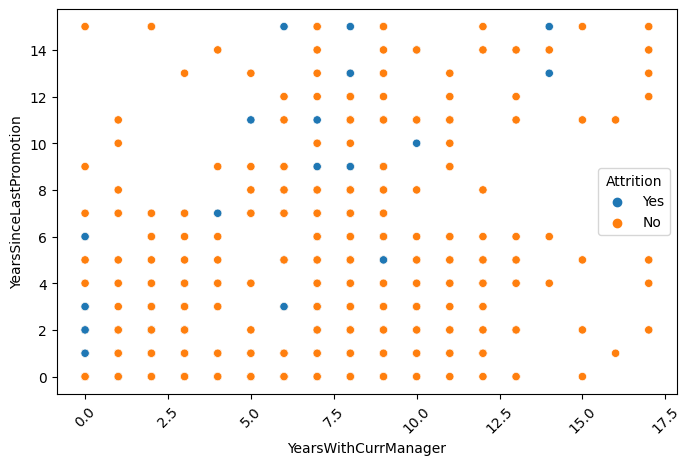

In [ ]:
for x in num_cols:
  for y in num_cols:
    if x!=y:
      plot_bivar_num(df,x,y)
    else:
      break

## Checking for correlations

1. general correlations
2. rates vs salary

### 1. General Correlations

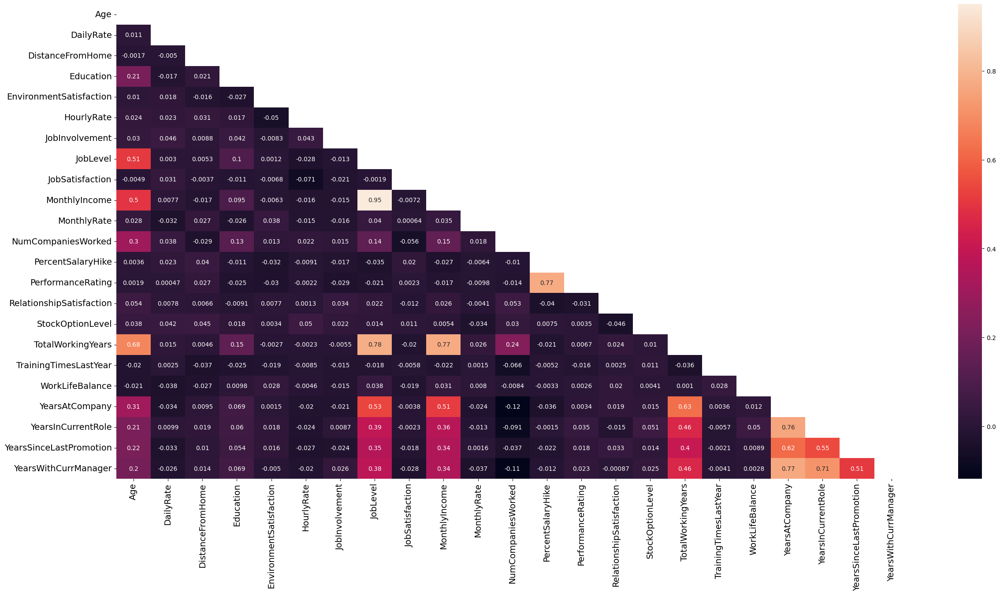

In [ ]:
# Set the default matplotlib figure size to 7x7:
fix, ax = plt.subplots(figsize=(29,14))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df.corr(), dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns to resize the labels.
ax = sns.heatmap(df.corr(), mask=mask, ax=ax, annot = True)

# Resize the labels.
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

# If you put plt.show() at the bottom, it prevents those useless printouts from matplotlib.
plt.show()

### 2. Rates vs Salary

In [ ]:
df_rates = df[["HourlyRate", "DailyRate", "MonthlyRate", "MonthlyIncome"]]

In [ ]:
df_rates.head()

#lets have a look at these numbers

,HourlyRate,DailyRate,MonthlyRate,MonthlyIncome
0,94,1102,19479,5993
1,61,279,24907,5130
2,92,1373,2396,2090
3,56,1392,23159,2909
4,40,591,16632,3468


In [ ]:
df_rates.corr()

#while these variables sound similar in nature, it doesnt seem like there are any significant correlations

,HourlyRate,DailyRate,MonthlyRate,MonthlyIncome
HourlyRate,1.000000,0.023381,-0.015297,-0.015794
DailyRate,0.023381,1.000000,-0.032182,0.007707
MonthlyRate,-0.015297,-0.032182,1.000000,0.034814
MonthlyIncome,-0.015794,0.007707,0.034814,1.000000


In [ ]:
df[df.MonthlyIncome==df.MonthlyIncome.max()]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
190,52,No,Travel_Rarely,699,Research & Development,1,4,Life Sciences,3,Male,...,3,1,1,34,5,3,33,18,11,9


In [ ]:
df[df.MonthlyRate==df.MonthlyRate.max()]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
513,20,Yes,Travel_Rarely,1362,Research & Development,10,1,Medical,4,Male,...,3,4,0,1,5,3,1,0,1,1


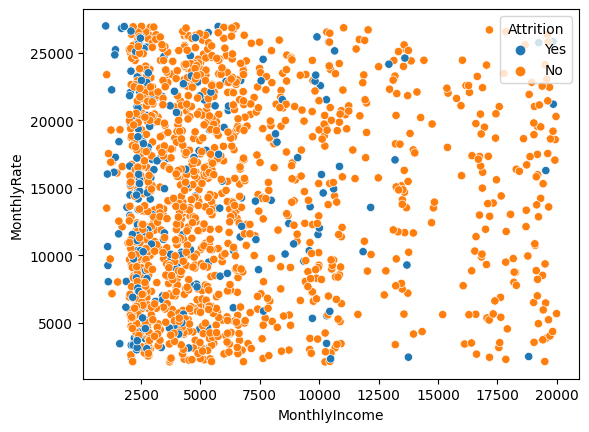

In [ ]:
sns.scatterplot(data=df, x="MonthlyIncome", y="MonthlyRate", hue="Attrition");
# no visible pattern

# Data processing
Feature Processing (dropping) + Engineering + Pipeline 

## Feature Processing + Engineering
Dropped 9 features that provided no information or are highly correlated to informative features\
Created 7 new features, modified age to be categorical
*Demographics*
1. Age Categories (Millenials, Gen X, Boomers, Silent)
2. Age with marital status (Age Cat * Marital Status) 
*Career History*
3. Job hopping tendency (TotalWorkingYears/NumCompaniesWorked)
4. First Job (NumcompaniesWorked == 0)
5. Tenure Ratio (YearsAtCompany/TotalWorkingYears)
*Compensation & Satisfaction*
7. Compensation wrt to median of job role, job level (MonthlyIncome/ Median(MonthlyIncome) )
8. Job Satisfaction * Work life balance 

In [ ]:
df = raw_data.copy()

In [ ]:
df['Attrition'] = df['Attrition'].replace({'Yes': 1, 'No': 0})

In [ ]:
# Remove columns that are highly correlated with others (to remove multicollinearity issues)
# df = df.drop(columns=['Over18', 'EmployeeNumber', 'StandardHours'])
# 'Over18', 'EmployeeNumber', 'StandardHours', 'EmployeeCount', are constant for all data
# DailyRate', 'MonthlyRate', 'HourlyRate',  related to income but do not provide significant information
# YearsInCurrentRole and YearsWithCurrManager are highly corrleated to YearsInCompany and provide minimal information. Instead computation of tenure ratio will provide more information. 
df = df.drop(columns=['Over18', 'EmployeeNumber', 'StandardHours', 'EmployeeCount', 'DailyRate', 'MonthlyRate', 'HourlyRate', 'YearsInCurrentRole', 'YearsWithCurrManager'])

In [ ]:
print(len(df.columns))
df.columns

26


Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsSinceLastPromotion'],
      dtype='object')

In [ ]:
def gen_age_cat(age_val):
    out = ''
    if age_val < 37:
        out = 'Millenials'
    
    elif age_val < 54:
        out = 'Generation X'
        
    elif age_val < 73:
        out = 'Boomers'
        
    else:
        out = 'Silent'
    return out

def age_cat(df):
  df['Age'] = df['Age'].apply(gen_age_cat)

def age_marital(df):
  df['AgeMartial'] = df['Age'].astype(str)+'_' +df['MaritalStatus'].astype(str)


def first_job(df):
  df['FirstJob'] = (df['NumCompaniesWorked'] == 0).astype(int)

def job_hopping(df):
  criteria = (df['NumCompaniesWorked'] > 0)
  df['JobHopIndex'] = [0 for i in range(len(df))]
  df.loc[criteria, 'JobHopIndex'] = (df['TotalWorkingYears']/df['NumCompaniesWorked'])

def tenure_ratio(df):
  criteria = (df['TotalWorkingYears'] > 0) &( df['YearsAtCompany'] > 0)
  df['TenureRatio'] = [0 for i in range(len(df))]
  df.loc[criteria, 'TenureRatio'] = df['YearsAtCompany']/df['TotalWorkingYears']

def compensation_ratio(df):
  joblevelmedian = df.groupby(['JobLevel']).MonthlyIncome.median()
  for i in joblevelmedian.index:
    criteria = (df['JobLevel']  == i)
    df.loc[criteria, 'MonthlyIncomeInJobLevel'] =  df.loc[criteria, 'MonthlyIncome'] /joblevelmedian[i]

  jobrolemedian = df.groupby(['JobRole']).MonthlyIncome.median()
  for i in jobrolemedian.index:
    criteria = (df['JobRole']  == i)
    df.loc[criteria, 'MonthlyIncomeInJobRole'] =  df.loc[criteria, 'MonthlyIncome'] /jobrolemedian[i]

def js_wlb(df):
  df['JobSatis_WLB_tmp'] = df['JobSatisfaction'] * df['WorkLifeBalance']
  rank = 0
  ## Converting to ordinal values
  for idx in df['JobSatis_WLB_tmp'].unique().argsort():
    js_wlb_val = df['JobSatis_WLB_tmp'].unique()[idx]
    criteria = (df['JobSatis_WLB_tmp'] == js_wlb_val)
    df.loc[criteria, 'JobSatis_WLB'] = rank
    rank += 1
  df['JobSatis_WLB'] = df['JobSatis_WLB'].astype(int)
  df.drop(columns='JobSatis_WLB_tmp',inplace=True)

def feature_engineering_wrapper(df):
  age_cat(df)
  age_marital(df)
  first_job(df)
  job_hopping(df)
  tenure_ratio(df)
  compensation_ratio(df)
  js_wlb(df)

In [ ]:
feature_engineering_wrapper(df)
df[['Age', 'AgeMartial','JobHopIndex','FirstJob','TenureRatio','MonthlyIncomeInJobLevel','MonthlyIncomeInJobRole','JobSatis_WLB']].head()

,Age,AgeMartial,JobHopIndex,FirstJob,TenureRatio,MonthlyIncomeInJobLevel,MonthlyIncomeInJobRole,JobSatis_WLB
0,Generation X,Generation X_Single,1.000000,0,0.750000,1.122285,0.961804,3
1,Generation X,Generation X_Married,10.000000,0,1.000000,0.960674,1.776623,4
2,Generation X,Generation X_Single,1.166667,0,0.000000,0.782772,0.724186,6
3,Millenials,Millenials_Married,8.000000,0,1.000000,1.089513,1.007446,6
4,Millenials,Millenials_Married,0.666667,0,0.333333,1.298876,1.201663,4


In [ ]:
print(len(df.columns))
print('---object---')
for col in df.columns:
  if df[col].dtype == 'object':
    print(col)


print('---int64---')
for col in df.columns:
  if df[col].dtype == 'int64':
    print(col)

print('---float64---')
for col in df.columns:
  if df[col].dtype == 'float64':
    print(col)

33
---object---
Age
BusinessTravel
Department
EducationField
Gender
JobRole
MaritalStatus
OverTime
AgeMartial
---int64---
Attrition
DistanceFromHome
Education
EnvironmentSatisfaction
JobInvolvement
JobLevel
JobSatisfaction
MonthlyIncome
NumCompaniesWorked
PercentSalaryHike
PerformanceRating
RelationshipSatisfaction
StockOptionLevel
TotalWorkingYears
TrainingTimesLastYear
WorkLifeBalance
YearsAtCompany
YearsSinceLastPromotion
FirstJob
JobSatis_WLB
---float64---
JobHopIndex
TenureRatio
MonthlyIncomeInJobLevel
MonthlyIncomeInJobRole


## Processing with Pipeline

In [ ]:
## Defining two pipelines
num_cols = list([ "MonthlyIncome", "DistanceFromHome", "NumCompaniesWorked", "PercentSalaryHike", "TotalWorkingYears", "TrainingTimesLastYear",
            "YearsAtCompany",  "YearsSinceLastPromotion", "JobHopIndex", "TenureRatio", "MonthlyIncomeInJobLevel", "MonthlyIncomeInJobRole"])

cat_cols = list(["Age", "Department", "EducationField", "Gender", "JobRole", "MaritalStatus", "OverTime", "AgeMartial", "FirstJob"])

ord_cols = list(["BusinessTravel", "Education", "EnvironmentSatisfaction", "JobInvolvement", "JobLevel", "JobSatisfaction",
                 "StockOptionLevel", "PerformanceRating", "WorkLifeBalance", "RelationshipSatisfaction", "JobSatis_WLB"]) 

print(len(num_cols) + len(cat_cols) + len(ord_cols)) 

ord_cols_to_process = ["BusinessTravel"] ##non ordinal values


categorical_transformer = OneHotEncoder(handle_unknown='ignore')
ordinal_transformer = OrdinalEncoder(categories=[[ 'Non-Travel', 'Travel_Rarely', 'Travel_Frequently']])
numeric_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, cat_cols),
        ('ord', ordinal_transformer, ord_cols_to_process),
        ('num', numeric_transformer, num_cols)
    ], remainder='passthrough')


                   
preprocessing_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
preprocessing_pipeline

32


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Age', 'Department',
                                                   'EducationField', 'Gender',
                                                   'JobRole', 'MaritalStatus',
                                                   'OverTime', 'AgeMartial',
                                                   'FirstJob']),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['Non-Travel',
                                                                              'Travel_Rarely',
                                                                              'Travel_Frequently']]),
                                                  ['BusinessTravel']),
                                                 ('num', StandardScaler(),
                                                  ['MonthlyIncome',
                                                   'DistanceFromHome',
                                                   'NumCompaniesWorked',
                                                   'PercentSalaryHike',
                                                   'TotalWorkingYears',
                                                   'TrainingTimesLastYear',
                                                   'YearsAtCompany',
                                                   'YearsSinceLastPromotion',
                                                   'JobHopIndex', 'TenureRatio',
                                                   'MonthlyIncomeInJobLevel',
                                                   'MonthlyIncomeInJobRole'])]))])

In [ ]:
# Split into train and test sets
X = df.drop(columns=['Attrition'])
y = df[['Attrition']]

X_train_temp, X_test_temp, y_train_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=2022, stratify=y)

In [ ]:
## Generating Train data. Preprocess and SMOTE
preprocessing_pipeline.fit(X_train_temp)
raw_transformed_cols = preprocessing_pipeline[0].get_feature_names_out()
transformed_cols = [ col.split('__')[1] for col in raw_transformed_cols]
X_train_processed = preprocessing_pipeline.transform(X_train_temp)
X_train_processed = pd.DataFrame(X_train_processed, columns=transformed_cols)



cat_cols_new = list(preprocessor.transformers_[0][1].get_feature_names_out(cat_cols))
ord_cols_new = list(preprocessor.transformers_[1][1].get_feature_names_out(ord_cols_to_process))

# Get the indices of the categorical features
categorical_features_mask = [True if col in (cat_cols_new + ord_cols_new + ord_cols) else False for col in X_train_processed.columns[:-1]]
smote_nc = SMOTENC(categorical_features=categorical_features_mask, random_state=2023)

X_train, y_train = smote_nc.fit_resample(X_train_processed, y_train_temp)
X_train.iloc[10:20]

,Age_Boomers,Age_Generation X,Age_Millenials,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,JobSatis_WLB
10,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,2.0,3.0,1.0,1.0,3.0,4.0,1.0,4.0,3.0
11,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,3.0,3.0,1.0,4.0,3.0,4.0,0.0,2.0,5.0
12,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,3.0,3.0,3.0,4.0,2.0,3.0,4.0,1.0,4.0,5.0
13,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,3.0,3.0,4.0,1.0,4.0,3.0,4.0,0.0,3.0,7.0
14,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,2.0,1.0,3.0,3.0,4.0,1.0,3.0,6.0
15,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,3.0,2.0,1.0,2.0,4.0,3.0,4.0,3.0,3.0,7.0
16,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,3.0,2.0,3.0,1.0,2.0,3.0,2.0,2.0,3.0,4.0
17,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,3.0,3.0,2.0,2.0,1.0,3.0,3.0,1.0,3.0,2.0
18,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,3.0,4.0,3.0,1.0,3.0,3.0,1.0,0.0,1.0,2.0
19,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,2.0,1.0,2.0,1.0,3.0,3.0,3.0,0.0,3.0,6.0


In [ ]:
## Generating Test data. Preprocess Only
X_test = preprocessing_pipeline.transform(X_test_temp)
X_test = pd.DataFrame(X_test, columns=transformed_cols)
X_test.head()

,Age_Boomers,Age_Generation X,Age_Millenials,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,JobSatis_WLB
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,4.0,1.0,2.0,3.0,1.0,3.0,2.0,0.0,3.0,2.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,4.0,3.0,1.0,1.0,3.0,2.0,2.0,2.0,1.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,3.0,3.0,2.0,1.0,3.0,3.0,4.0,1.0,2.0,4.0
3,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,3.0,3.0,3.0,1.0,2.0,4.0,4.0,1.0,3.0,4.0
4,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,3.0,1.0,3.0,4.0,3.0,3.0,3.0,0.0,1.0,2.0


In [ ]:
##1D array 
y_train= np.array(y_train).ravel()
y_test = np.array(y_test).ravel()
print(y_train.shape)

(1972,)


# Main model + helper functions

In [ ]:
# full set
log_grid = {
    'penalty' : ['l2', 'none'],
    'C': np.linspace(1, 2, num=10)
}

svm_grid = {
    'kernel': ['linear'],
}

nn_grid = {
    'n_neighbors' : [i for i in range(1,5)]
}

dt_grid = {
    'max_depth': [i for i in range(10,15)],  
    'max_leaf_nodes':[i for i in range(2,5)],
    'min_samples_split':[i for i in range(2,5)],
} 

boost_grid = {
    'n_estimators': [i for i in range(50,300,50)],  
    'learning_rate': np.linspace(0.1, 1.0, num=10)
}

rf_grid = {
    'max_depth': [i for i in range(10,15)],  
    'max_leaf_nodes':[i for i in range(2,5)],
    'min_samples_split':[i for i in range(2,5)],
} 

grids_full = [log_grid, svm_grid, nn_grid, dt_grid, boost_grid, rf_grid]

In [ ]:
# Trial set (use this if just testing out the grid_search function below: ~40s)
log_grid = {
    'penalty' : ['l2'],
    'C': np.linspace(1, 2, num=2)
}

svm_grid = {
    'kernel': ['linear']
}

nn_grid = {
    'n_neighbors' : [i for i in range(1,3)]
}

dt_grid = {
    'max_depth': [i for i in range(10,11)],  
    'max_leaf_nodes':[i for i in range(2,3)],
    'min_samples_split':[i for i in range(2,3)],
} 

boost_grid = {
    'n_estimators': [i for i in range(50, 200, 50)],  
    'learning_rate': np.linspace(0.1, 1.0, num=3)
}

rf_grid = {
    'max_depth': [i for i in range(10,11)],  
    'max_leaf_nodes':[i for i in range(2,3)],
    'min_samples_split':[i for i in range(2,3)],
} 

grids_trial = [log_grid, svm_grid, nn_grid, dt_grid, boost_grid, rf_grid]

In [ ]:
## Edited expected value fn too
def expected_value_fn(y, y_pred, cost_benefit_matrix):
    conf_mat = confusion_matrix(y, y_pred, labels = [True, False], normalize='all')
    return (conf_mat * cost_benefit_matrix).sum()

In [ ]:
def grid_search(X_train, y_train, X_test, y_test, cost_benefit_matrix, grids, rs=2023, threshold=0.5):
  cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=rs)

  log = LogisticRegression(max_iter=1000) ## Increase if warning about non-convergence
  svm = SVC(probability=True, max_iter=6000)
  nn = KNeighborsClassifier()
  dt = DecisionTreeClassifier(random_state=rs) 
  boost = GradientBoostingClassifier(max_depth=1, random_state=rs)
  rf = RandomForestClassifier(n_estimators=500, random_state=rs)

  models = [log, svm, nn, dt, boost, rf]
  results = []

  for model_index in range(len(models)):
    start = time.time()
    print(f'grid searching.... {models[model_index]}')
    grid = GridSearchCV(models[model_index], grids[model_index], scoring=make_scorer(expected_value_fn, cost_benefit_matrix=cost_benefit_matrix), cv=cv)
    grid.fit(X_train, y_train)
    result = pd.DataFrame(grid.cv_results_)
    result = result.sort_values(by = 'rank_test_score').iloc[0].params
    results.append(result)
    print(f'Time taken={(time.time()-start)/60: .3f}mins')
    print()

  log = LogisticRegression(penalty=results[0]['penalty'], C=results[0]['C'])
  svm = SVC(kernel=results[1]['kernel'], probability=True)
  nn = KNeighborsClassifier(n_neighbors=results[2]['n_neighbors'])  
  dt = DecisionTreeClassifier(max_depth=results[3]['max_depth'], max_leaf_nodes=results[3]['max_leaf_nodes'], min_samples_split=results[3]['min_samples_split'], random_state=rs)
  boost = GradientBoostingClassifier(max_depth=1, learning_rate=results[4]['learning_rate'], n_estimators=results[4]['n_estimators'], random_state=rs)
  rf = RandomForestClassifier(n_estimators=500, max_depth=results[5]['max_depth'], max_leaf_nodes=results[5]['max_leaf_nodes'], min_samples_split=results[5]['min_samples_split'], random_state=rs)
  
  best_models = {'LR': log,
                 'SVM': svm,
                 'KNN': nn,
                 'DT': dt,
                 'Boost': boost,
                 'RF': rf}

  print()
  print('='*30)

  ## Edited model to best models
  model_index = 0
  for model_key in best_models.keys():
    print(f'fitting tuned model.... {model_key}\n')
    best_models[model_key].fit(X_train, y_train)
    y_pred_test = best_models[model_key].predict(X_test)
    expected_value = expected_value_fn(y_test, y_pred_test, cost_benefit_matrix)
    print(f'Expected value of best model= {expected_value}')
    print(f'Set of hyperparameters: {results[model_index]}')
    print(classification_report(y_test, y_pred_test, labels = [True, False]))
    print('------------------------------------------------------\n')

    model_index += 1

  return best_models


## Helper Functions For Performance Evaluation


In [ ]:
def plot_roc_and_gain(all_scores):
  # Plot ROC and Gain curves for multiple classifiers
  plt.figure(figsize=(10, 5))

  # Iterate over classifiers
  for name, y_score in all_scores.items():
      
      # Compute ROC curve and ROC AUC
      fpr, tpr, _ = roc_curve(y_test, y_score)
      roc_auc = auc(fpr, tpr)
      
      # Plot ROC curve
      plt.subplot(1, 2, 1)
      plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (name, roc_auc))
      
      # Compute and plot Gain curve
      plt.subplot(1, 2, 2)
      sorted_indices = np.argsort(y_score)[::-1]
      sorted_true_labels = y_test[sorted_indices]
      gains = np.cumsum(sorted_true_labels) / np.sum(sorted_true_labels)
      gains = np.insert(gains, 0, 0)
      n = len(y_test)
      x_values = np.arange(n + 1) / n
      plt.plot(x_values, gains, label=name)

  # Set up ROC curve plot
  plt.subplot(1, 2, 1)
  plt.plot([0, 1], [0, 1], 'k--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver Operating Characteristic')
  plt.legend(loc="lower right")

  # Set up Gain curve plot
  plt.subplot(1, 2, 2)
  plt.plot([0, 1], [0, 1], 'k--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('Fraction of Sample')
  plt.ylabel('Gain')
  plt.title('Cumulative Gain')
  plt.legend(loc="lower right")

  # Show the combined plot
  plt.tight_layout()
  plt.show()

In [ ]:
def plot_ev(all_scores, decision_thres=0.5, verbose=False):
  # Define a range of decision thresholds
  thresholds = np.linspace(0, 1, num=101)
  plt.figure(figsize=(18, 5))

  for name, y_score in all_scores.items():
      expected_values = []
      precision_values = []
      recall_values = []

      for threshold in thresholds:
        y_pred = (y_score >= threshold).astype(int)

        ev = expected_value_fn(y_test, y_pred, cbm)
        expected_values.append(ev)
        precision, recall, _, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
        precision_values.append(precision)
        recall_values.append(recall)
      if verbose:
        print(expected_values)

      plt.subplot(1, 3, 1)
      plt.plot(thresholds, expected_values, label=f'{name} - {expected_values[expected_values.index(max(expected_values))]:.2f} at {thresholds[expected_values.index(max(expected_values))]:.2f}')

      plt.subplot(1, 3, 2)
      plt.plot(thresholds, precision_values, label=f'{name}')

      plt.subplot(1, 3, 3)
      plt.plot(thresholds, recall_values, label=f'{name}')

  if verbose:
    print(thresholds)
  plt.subplot(1, 3, 1)
  # plt.axhline(y=0, color='black', linestyle='--')
  plt.axvline(x=decision_thres, color='grey', linestyle='--', label='decision_thres')

  plt.xlabel("Decision Threshold")
  plt.ylabel("Expected Value")
  plt.title("Change in Expected Value")
  plt.legend(loc="lower left")

  plt.subplot(1, 3, 2)
  plt.xlabel("Decision Threshold")
  plt.ylabel("precisions")
  plt.title("Change in precision")
  plt.axvline(x=decision_thres, color='grey', linestyle='--', label='curr thres')
  plt.legend(loc="upper left")

  plt.subplot(1, 3, 3)
  plt.xlabel("Decision Threshold")
  plt.ylabel("recall")
  plt.title("Change in recall")
  plt.axvline(x=decision_thres, color='grey', linestyle='--', label='curr thres')
  plt.legend(loc="lower left")

  plt.show()

In [ ]:
def rf_feat_wrapper(best_model, X_in, y_in):
  best_model.fit(X_in, y_in)
  importances = best_model.feature_importances_
  feature_names = np.array(X_in.columns)

  top_x_features = 10
  # Sort the feature importances in descending order
  indices = np.argsort(importances)[::-1][:top_x_features][::-1]

  # Print the feature ranking
  print("Feature ranking:")
  for f in range(top_x_features):
      print("%d. feature %d (%f): %s" % (f + 1, indices[f], importances[indices[f]], feature_names[indices[f]]))


  # Plot the feature importances
  plt.figure()
  plt.barh(range(top_x_features), importances[indices], color="blue", align="center")
  plt.yticks(range(top_x_features), feature_names[indices])
  plt.xlabel("Importance")
  plt.title("RF Feature Importance")
  plt.show()


In [ ]:
def lr_feat_wrapper(best_model, X_in, y_in):
  best_model.fit(X_in, y_in)
  importances = best_model.coef_[0]
  feature_names = np.array(X_in.columns)

  top_x_features = 10
  # Sort the feature importances in descending order
  indices = np.argsort(importances)[::-1][:top_x_features]

  # Print the feature ranking
  print("Feature ranking:")
  for f in range(top_x_features):
      print("%d. feature %d (%f): %s" % (f + 1, indices[f], importances[indices[f]], feature_names[indices[f]]))

  plt.figure(figsize=(10,6))
  plt.bar(range(top_x_features), importances[indices], color="blue", align="center")
  plt.xticks(range(top_x_features), feature_names[indices], rotation=90)
  plt.xlim([-1, top_x_features])
  plt.xlabel("Feature")
  plt.ylabel("Feature Importance")
  plt.title("Logistic Regression Feature Importance")
  plt.show()

In [ ]:
def permutation_wrapper(best_model, X_in, y_in, title='TEST'):
  result = permutation_importance(best_model, X_in, y_in, n_repeats=10, random_state=2023)

  # Sort the importance scores
  sorted_idx = result.importances_mean.argsort()

  top_x_features = 10
  sorted_abs_idx = np.argsort(result.importances_mean)
  sorted_abs_idx = sorted_abs_idx[::-1][:top_x_features][::-1]

  plt.title(f"Permutation Impt ({title})")
  plt.barh(range(top_x_features), result.importances_mean[sorted_abs_idx], color='steelblue', align="center")
  plt.yticks(range(top_x_features), X_in.columns[sorted_abs_idx])
  plt.xlabel("Importance")
  plt.show()

# Baseline
cbm1\
[ 15. -12.]\
 [ -3.   0.]\
cbm2\
[  6.6 -12. ]\
 [ -3.    0. ]\
cbm3\
[ -0.6 -12. ]\
 [ -3.    0. ]\
random strategy\
cbm1: -2.077, cbm2: -1.731, cbm3: -2.423\
no strategy\
cbm1: -2.307, cbm2: -2.307, cbm3: -2.307\
all strategy\
cbm1: -1.847, cbm2: -1.155, cbm3: -2.539

In [ ]:
cost_attrition = 12
cbm1 = np.array([[-3 + 0.5*cost_attrition, -cost_attrition],
                [-3, 0]])

cbm2 = np.array([[-3+0.8*cost_attrition, -cost_attrition],
                [-3, 0]])


cbm3 = np.array([[-3+0.2*cost_attrition, -cost_attrition],
                [-3, 0]])

print(cbm1)
print(cbm2)
print(cbm3)

attr_rate = 237/1233
random_strat = np.array([[0.5*attr_rate, 0.5*attr_rate],
                        [0.5*(1-attr_rate), 0.5*(1-attr_rate)]])

ev_1 = (random_strat*cbm1).sum()
ev_2 = (random_strat*cbm2).sum()
ev_3 = (random_strat*cbm3).sum()
print('random strategy')
print(f'cbm1: {ev_1:.3f}, cbm2: {ev_2:.3f}, cbm3: {ev_3:.3f}')


no_strat = np.array([[0, attr_rate],
                     [0, (1-attr_rate)]])

ev_1 = (no_strat*cbm1).sum()
ev_2 = (no_strat*cbm2).sum()
ev_3 = (no_strat*cbm3).sum()
print('no strategy')
print(f'cbm1: {ev_1:.3f}, cbm2: {ev_2:.3f}, cbm3: {ev_3:.3f}')


all_strat = np.array([[attr_rate, 0],
                     [1-attr_rate, 0 ]])

ev_1 = (all_strat*cbm1).sum()
ev_2 = (all_strat*cbm2).sum()
ev_3 = (all_strat*cbm3).sum()
print('all strategy')
print(f'cbm1: {ev_1:.3f}, cbm2: {ev_2:.3f}, cbm3: {ev_3:.3f}')

[[  3. -12.]
 [ -3.   0.]]
[[  6.6 -12. ]
 [ -3.    0. ]]
[[ -0.6 -12. ]
 [ -3.    0. ]]
random strategy
cbm1: -2.077, cbm2: -1.731, cbm3: -2.423
no strategy
cbm1: -2.307, cbm2: -2.307, cbm3: -2.307
all strategy
cbm1: -1.847, cbm2: -1.155, cbm3: -2.539


#Model Selection for CBM1
[[ 15. -12.]\
[ -3. 0.]]
Model Selection Steps:
1. Initial Training + Tuning
2. Model Selection based on EV and performance curves
3. Recursive Feature Elimination (RFE)
4. Final Selection


## Training

In [ ]:
## seems like confusion amtrix is defined with first row as true attrition and second row as true no attrition
cbm = cbm1
#best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_trial) # use this is just wna test code
best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_full) # use this for actl HP tuning

grid searching.... LogisticRegression(max_iter=1000)
Time taken= 0.594mins

grid searching.... SVC(max_iter=6000, probability=True)
Time taken= 0.053mins

grid searching.... KNeighborsClassifier()
Time taken= 0.010mins

grid searching.... DecisionTreeClassifier(random_state=2023)
Time taken= 0.053mins

grid searching.... GradientBoostingClassifier(max_depth=1, random_state=2023)
Time taken= 2.203mins

grid searching.... RandomForestClassifier(n_estimators=500, random_state=2023)
Time taken= 4.853mins


fitting tuned model.... LR

Expected value of best model= -0.989795918367347
Set of hyperparameters: {'C': 1.4444444444444444, 'penalty': 'none'}
              precision    recall  f1-score   support

        True       0.60      0.45      0.51        47
       False       0.90      0.94      0.92       247

    accuracy                           0.86       294
   macro avg       0.75      0.70      0.72       294
weighted avg       0.85      0.86      0.86       294

-------------------

In [ ]:
## Visualising performance
all_scores = {}
for model_key in best_models.keys():
  # best_models[model_key].fit(X_train, y_train)
  y_score = best_models[model_key].predict_proba(X_test)[:,1]
  all_scores[model_key] = y_score

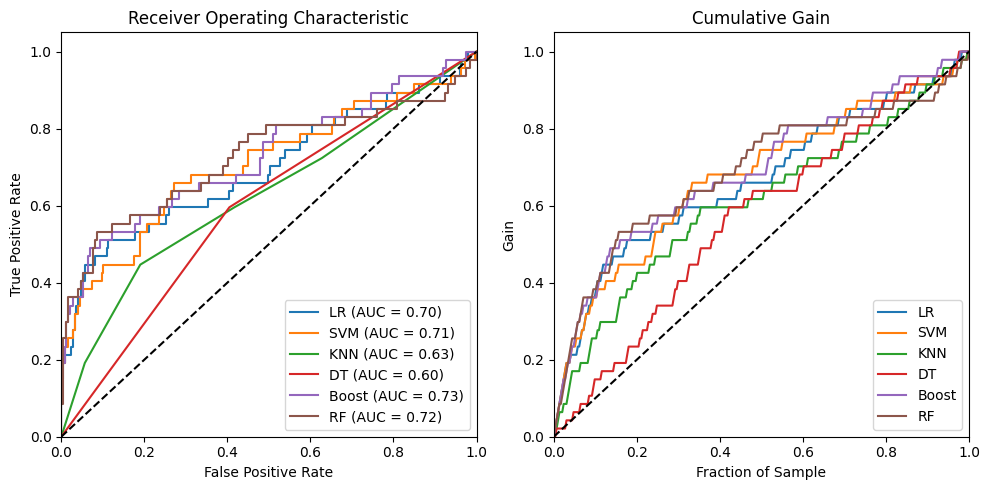

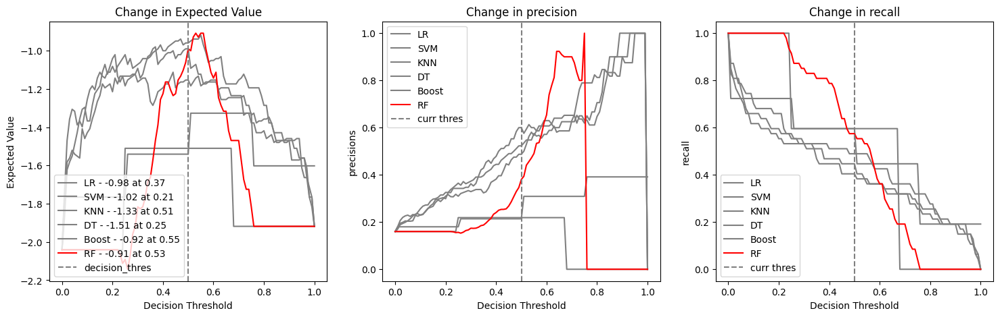

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores)

In [ ]:
# best_model = best_models['SVM']
# best_model = best_models['LR']
# best_model = best_models['Boost']
# best_model = best_models['RF']
# best_model.fit(X_train, y_train)
best_model = RandomForestClassifier(max_depth=14, max_leaf_nodes=4, min_samples_split=4,
                       n_estimators=500, random_state=2023)

## Recursive Feature Elimination (RFE) 
First cell is the tuning of num features while second cell is manual training based on optimal feature

In [ ]:
cbm

array([[  3., -12.],
       [ -3.,   0.]])

In [ ]:
# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5)

# Instantiate the RFECV object
rfecv = RFECV(best_model, step=5, cv=cv, scoring=make_scorer(expected_value_fn, cost_benefit_matrix=cbm))

# Fit RFECV on the training data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_
print("Optimal number of features:", optimal_num_features)

# Get the selected features
selected_features_idx = np.where(rfecv.support_)[0]
drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
selected_features = X_train.columns[selected_features_idx]
drop_features =  X_train.columns[drop_features_idx] 
print("Selected features:", selected_features)
print("Drop features:", drop_features)


# Transform the data to keep only the selected features
X_train_selected = rfecv.transform(X_train)
X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
X_test_selected = rfecv.transform(X_test)
X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

best_model.fit(X_train, y_train)
y_test_pred = best_model.predict(X_test)
print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# Train and evaluate the model using the selected features
best_model.fit(X_train_selected, y_train)
y_test_pred = best_model.predict(X_test_selected)

print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

Optimal number of features: 62
Selected features: Index(['Age_Boomers', 'Age_Generation X', 'Age_Millenials',
       'Department_Human Resources', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Female', 'Gender_Male',
       'JobRole_Healthcare Representative', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'JobRole_Sales Representative', 'MaritalStatus_Divorced',
       'MaritalStatus_Married', 'MaritalStatus_Single', 'OverTime_No',
       'OverTime_Yes', 'AgeMartial_Boomers_Divorced',
       'AgeMartial_Boomers_Married', 'AgeMartial_Boomers_Single',
       'AgeMartial_Generation X_Divor

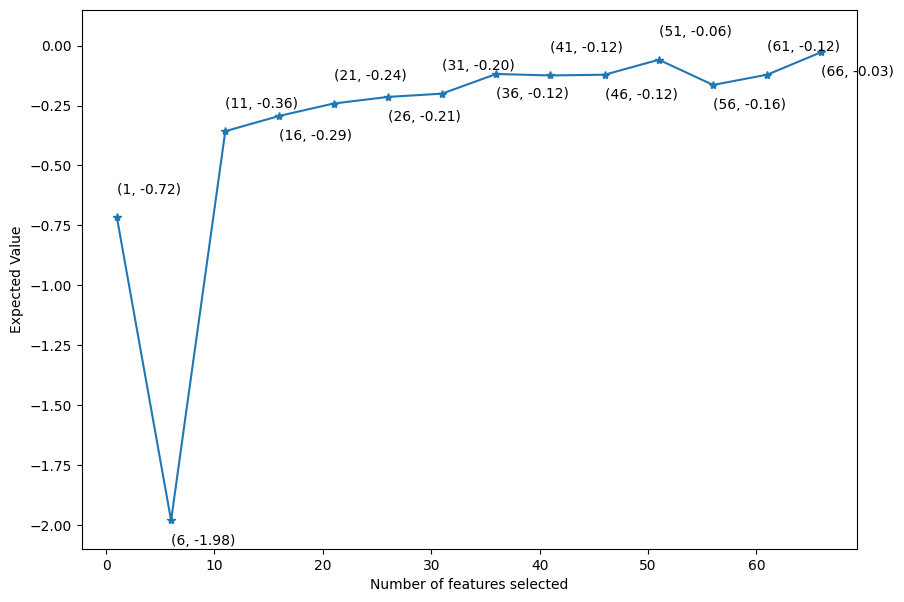

In [ ]:
plt.figure(figsize=(10,7))
plt.xlabel("Number of features selected")
plt.ylabel("Expected Value")
x_range=  range(1, len(rfecv.cv_results_['mean_test_score'])*5 + 1, 5)
plt.plot(x_range,rfecv.cv_results_['mean_test_score'], marker='*')
mult = 1
for i, j in zip(x_range,rfecv.cv_results_['mean_test_score']):
  plt.text(i, j+0.1*mult, f'({i}, {j:.2f})')
  mult = 1 if mult == -1 else -1

plt.ylim(-2.1, 0.15)
plt.show()

In [ ]:
# Instantiate the RFE object
num_features_to_select = 20  # Specify the number of top features to select
rfe = RFE(best_model, n_features_to_select=num_features_to_select, step=1)

# Fit RFE on the training data
rfe.fit(X_train, y_train)

# Get the selected features
selected_features_idx = np.where(rfe.support_)[0]
drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
selected_features = X_train.columns[selected_features_idx]
drop_features =  X_train.columns[drop_features_idx] 
print("Selected features:", selected_features)
print("Drop features:", drop_features)

# Get the feature ranking
feature_ranking = rfe.ranking_
feature_ranking_idx = feature_ranking.argsort()
for f_idx in feature_ranking_idx:
  ranking = feature_ranking[f_idx]
  feature = X_train.columns[f_idx]
  drop = '' if ranking == 1 else 'dropped'
  print(f'Feature {feature} --- rank {ranking} {drop}')

# Transform the data to keep only the selected features
X_train_selected = rfe.transform(X_train)
X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
X_test_selected = rfe.transform(X_test)
X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

best_model.fit(X_train, y_train)
y_test_pred = best_model.predict(X_test)
print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# Train and evaluate the model using the selected features
best_model.fit(X_train_selected, y_train)
y_test_pred = best_model.predict(X_test_selected)

print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

Selected features: Index(['Age_Generation X', 'Age_Millenials',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Medical', 'JobRole_Healthcare Representative',
       'JobRole_Manufacturing Director', 'JobRole_Research Scientist',
       'JobRole_Sales Executive', 'MaritalStatus_Divorced',
       'MaritalStatus_Married', 'MaritalStatus_Single', 'OverTime_No',
       'OverTime_Yes', 'AgeMartial_Generation X_Divorced',
       'AgeMartial_Generation X_Married', 'AgeMartial_Generation X_Single',
       'AgeMartial_Millenials_Married', 'AgeMartial_Millenials_Single',
       'FirstJob_0', 'FirstJob_1', 'BusinessTravel', 'MonthlyIncome',
       'DistanceFromHome', 'NumCompaniesWorked', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion',
       'JobHopIndex', 'MonthlyIncomeInJobRole', 'EnvironmentSatisfaction',
       'JobLevel', 'JobSatisfaction', 'StockOptionLevel', 'JobSatis_WLB'],
      dtype='object')
Drop

### Feature Importance post feature selection

Feature ranking:
1. feature 11 (0.027341): AgeMartial_Millenials_Single
2. feature 14 (0.039122): TotalWorkingYears
3. feature 15 (0.045678): YearsAtCompany
4. feature 6 (0.049123): MaritalStatus_Single
5. feature 13 (0.059302): MonthlyIncome
6. feature 1 (0.070443): Age_Millenials
7. feature 7 (0.102352): OverTime_No
8. feature 8 (0.111922): OverTime_Yes
9. feature 17 (0.147960): JobLevel
10. feature 18 (0.228279): StockOptionLevel


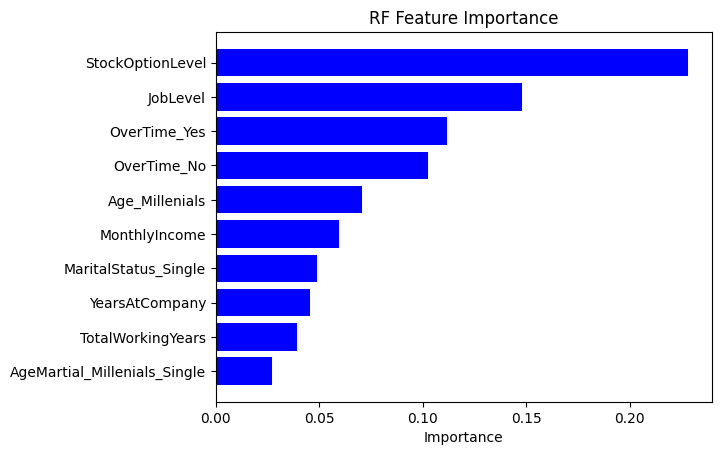

In [ ]:
rf_feat_wrapper(best_model, X_train_selected, y_train) ## Only if best model is RF

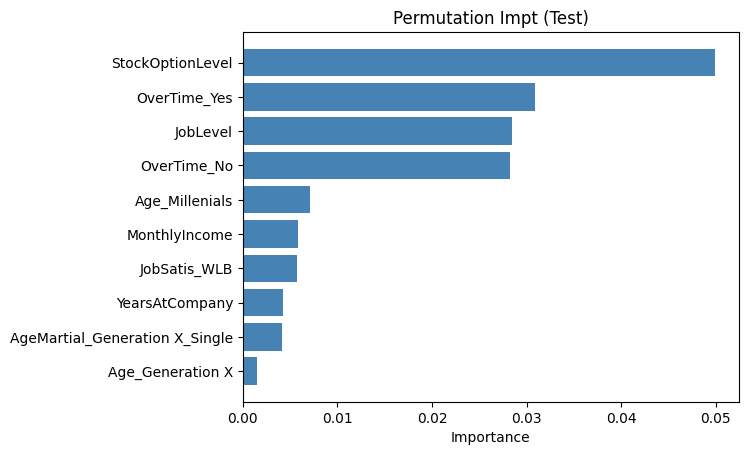

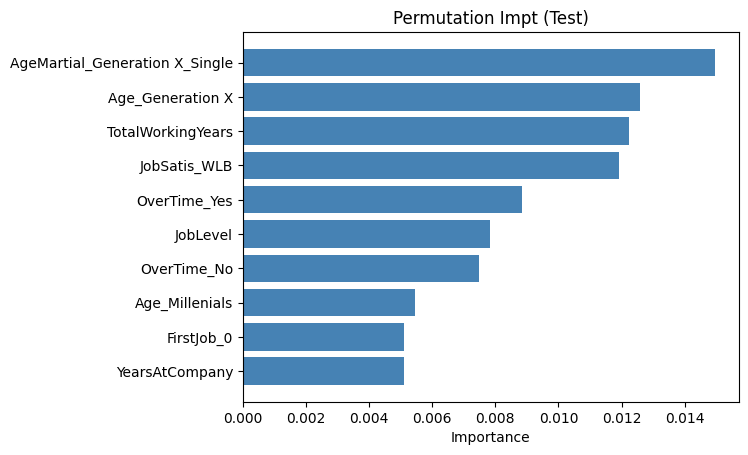

In [ ]:
best_model.fit(X_train_selected, y_train)
permutation_wrapper(best_model, X_train_selected, y_train, title='Test')
permutation_wrapper(best_model, X_test_selected, y_test, title='Test')

## Final Performance Evaluation

In [ ]:
all_scores = {}
models = {'old_model': [X_train, X_test], 
          'new_model': [X_train_selected, X_test_selected]}

for name, (X_train_in, X_test_in) in models.items():
  best_model.fit(X_train_in, y_train)
  y_scores = best_model.predict_proba(X_test_in)[:,1]
  all_scores[name] = y_scores

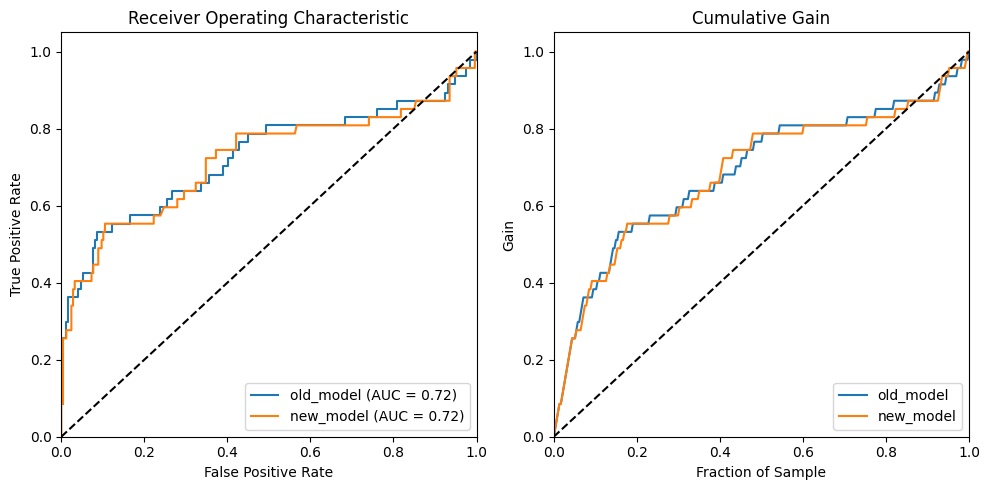

[-2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0408163265306123, -2.0612244897959187, -2.112244897959184, -2.0918367346938775, -2.142857142857143, -2.0714285714285716, -1.9591836734693877, -1.9183673469387754, -1.816326530612245, -1.826530612244898, -1.8163265306122451, -1.7653061224489797, -1.683673469387755, -1.663265306122449, -1.5714285714285714, -1.469387755102041, -1.3877551020408163, -1.2551020408163265, -1.2244897959183674, -1.1632653061224492, -1.1632653061224492, -1.2040816326530612, -1.2346938775510206, -1.2244897959183674, -1.153061224489796, -1.1326530612244898,

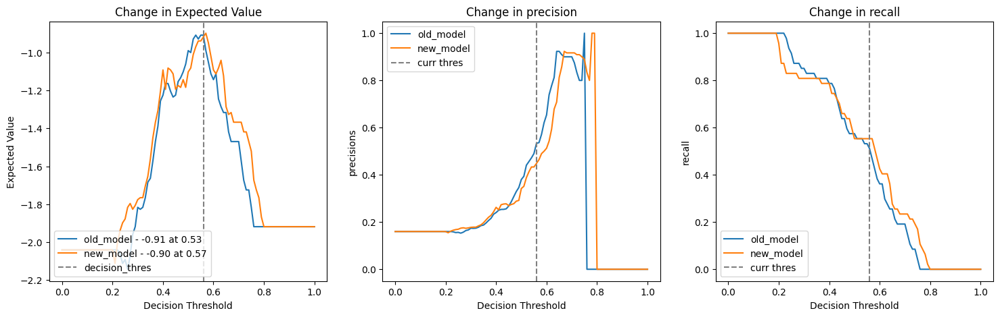

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores, decision_thres=0.56, verbose=True)

# Model Selection for CBM2

[[ 6.6 -12. ]\
[ -3. 0. ]]

## Training

In [ ]:
## seems like confusion amtrix is defined with first row as true attrition and second row as true no attrition
cbm = cbm2
print(cbm)
#best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_trial) # use this is just wna test code
best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_full) # use this for actl HP tuning

[[  6.6 -12. ]
 [ -3.    0. ]]
grid searching.... LogisticRegression(max_iter=1000)
Time taken= 0.603mins

grid searching.... SVC(max_iter=6000, probability=True)
Time taken= 0.154mins

grid searching.... KNeighborsClassifier()
Time taken= 0.022mins

grid searching.... DecisionTreeClassifier(random_state=2023)
Time taken= 0.052mins

grid searching.... GradientBoostingClassifier(max_depth=1, random_state=2023)
Time taken= 2.185mins

grid searching.... RandomForestClassifier(n_estimators=500, random_state=2023)
Time taken= 4.917mins


fitting tuned model.... LR

Expected value of best model= -0.7326530612244897
Set of hyperparameters: {'C': 1.4444444444444444, 'penalty': 'none'}
              precision    recall  f1-score   support

        True       0.60      0.45      0.51        47
       False       0.90      0.94      0.92       247

    accuracy                           0.86       294
   macro avg       0.75      0.70      0.72       294
weighted avg       0.85      0.86      0.8

In [ ]:
## Visualising performance
all_scores = {}
for model_key in best_models.keys():
  # best_models[model_key].fit(X_train, y_train)
  y_score = best_models[model_key].predict_proba(X_test)[:,1]
  all_scores[model_key] = y_score

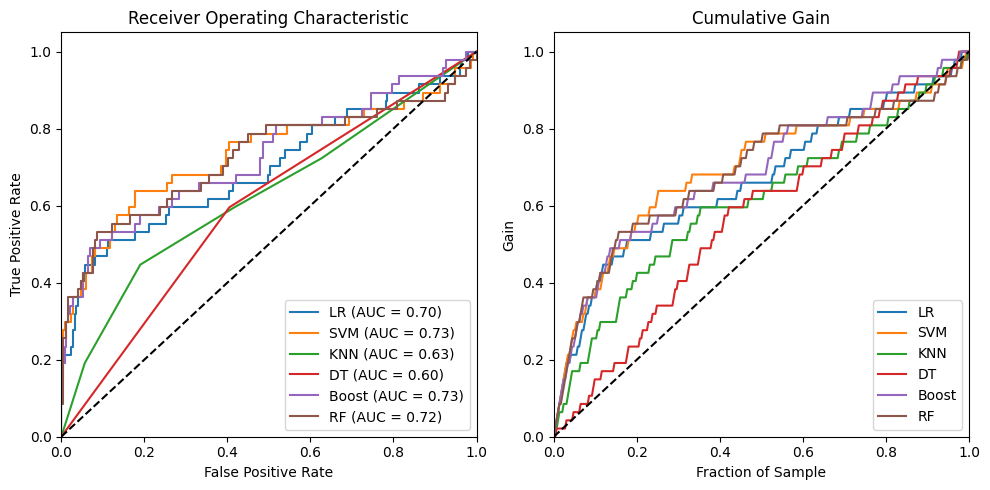

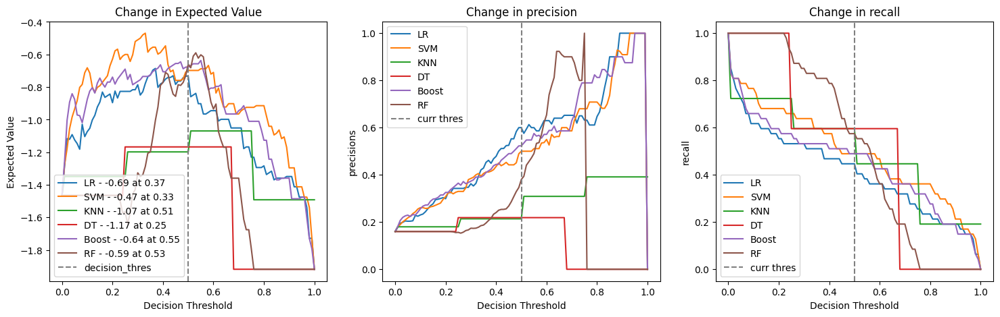

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores)

In [ ]:
# best_model = best_models['SVM']
# best_model = best_models['LR']
# best_model = best_models['Boost']
best_model = best_models['RF']

# best_model.fit(X_train, y_train)

## Recursive Feature Elimination (RFE) 
First cell is the tuning of num features while second cell is manual training based on optimal feature

Optimal number of features: 62
Selected features: Index(['Age_Boomers', 'Age_Generation X', 'Age_Millenials',
       'Department_Human Resources', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Female', 'Gender_Male',
       'JobRole_Healthcare Representative', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'JobRole_Sales Representative', 'MaritalStatus_Divorced',
       'MaritalStatus_Married', 'MaritalStatus_Single', 'OverTime_No',
       'OverTime_Yes', 'AgeMartial_Boomers_Divorced',
       'AgeMartial_Boomers_Married', 'AgeMartial_Boomers_Single',
       'AgeMartial_Generation X_Divor

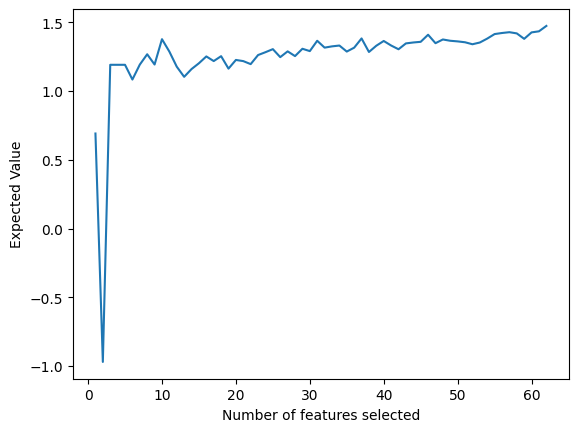

In [ ]:
# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5)

# Instantiate the RFECV object
rfecv = RFECV(best_model, step=1, cv=cv, scoring=make_scorer(expected_value_fn, cost_benefit_matrix=cbm))

# Fit RFECV on the training data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_
print("Optimal number of features:", optimal_num_features)

# Get the selected features
selected_features_idx = np.where(rfecv.support_)[0]
drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
selected_features = X_train.columns[selected_features_idx]
drop_features =  X_train.columns[drop_features_idx] 
print("Selected features:", selected_features)
print("Drop features:", drop_features)

# Transform the data to keep only the selected features
X_train_selected = rfecv.transform(X_train)
X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
X_test_selected = rfecv.transform(X_test)
X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

best_model.fit(X_train, y_train)
y_test_pred = best_model.predict(X_test)
print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# Train and evaluate the model using the selected features
best_model.fit(X_train_selected, y_train)
y_test_pred = best_model.predict(X_test_selected)

print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Expected Value")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()


In [ ]:
# # Instantiate the RFE object
# num_features_to_select = 31  # Specify the number of top features to select
# rfe = RFE(best_model, n_features_to_select=num_features_to_select, step=1)

# # Fit RFE on the training data
# rfe.fit(X_train, y_train)

# # Get the selected features
# selected_features_idx = np.where(rfe.support_)[0]
# drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
# selected_features = X_train.columns[selected_features_idx]
# drop_features =  X_train.columns[drop_features_idx] 
# print("Selected features:", selected_features)
# print("Drop features:", drop_features)

# # Get the feature ranking
# feature_ranking = rfe.ranking_
# feature_ranking_idx = feature_ranking.argsort()
# for f_idx in feature_ranking_idx:
#   ranking = feature_ranking[f_idx]
#   feature = X_train.columns[f_idx]
#   drop = '' if ranking == 1 else 'dropped'
#   print(f'Feature {feature} --- rank {ranking} {drop}')

# # Transform the data to keep only the selected features
# X_train_selected = rfe.transform(X_train)
# X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
# X_test_selected = rfe.transform(X_test)
# X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

# best_model.fit(X_train, y_train)
# y_test_pred = best_model.predict(X_test)
# print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# # Train and evaluate the model using the selected features
# best_model.fit(X_train_selected, y_train)
# y_test_pred = best_model.predict(X_test_selected)

# print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

### Feature Importance post feature selection

Feature ranking:
1. feature 1 (0.037745): Age_Generation X
2. feature 46 (0.042236): YearsAtCompany
3. feature 25 (0.047188): MaritalStatus_Single
4. feature 44 (0.051612): TotalWorkingYears
5. feature 40 (0.058422): MonthlyIncome
6. feature 2 (0.062871): Age_Millenials
7. feature 26 (0.091084): OverTime_No
8. feature 27 (0.100069): OverTime_Yes
9. feature 55 (0.106059): JobLevel
10. feature 59 (0.140328): StockOptionLevel


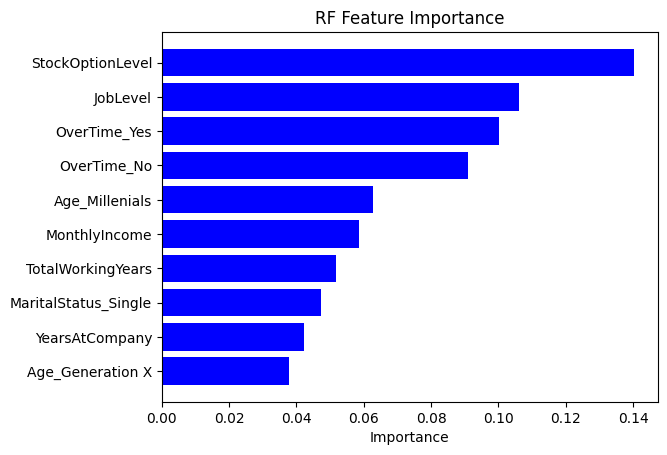

In [ ]:
rf_feat_wrapper(best_model, X_train_selected, y_train) ## Only if best model is RF

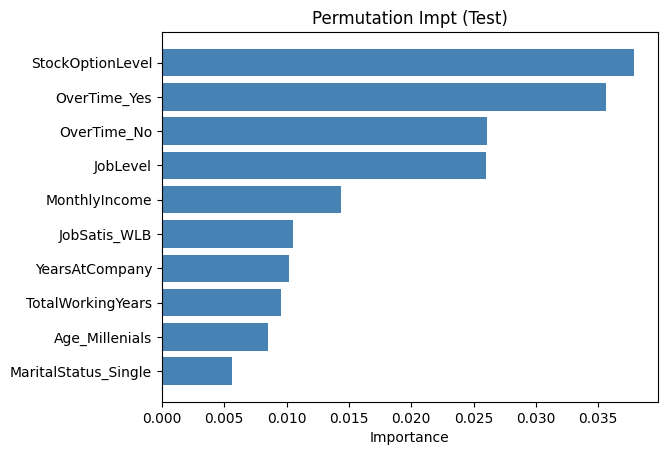

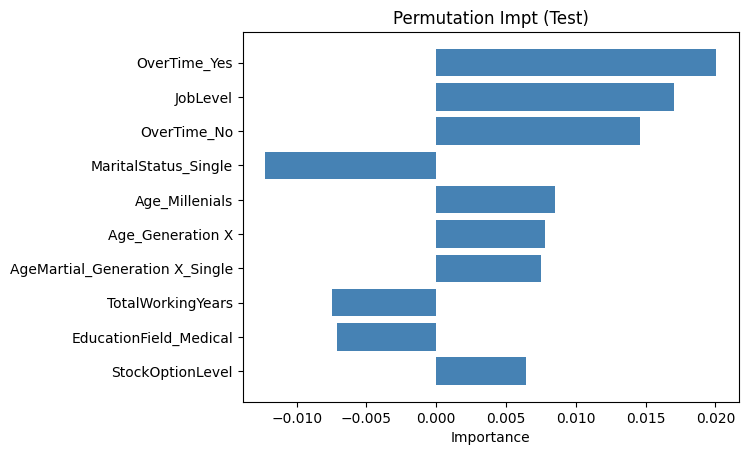

In [ ]:
best_model.fit(X_train_selected, y_train)
permutation_wrapper(best_model, X_train_selected, y_train, title='Test')
permutation_wrapper(best_model, X_test_selected, y_test, title='Test')

## Final Performance Evaluation

In [ ]:
all_scores = {}
models = {'old_model': [X_train, X_test], 
          'new_model': [X_train_selected, X_test_selected]}

for name, (X_train_in, X_test_in) in models.items():
  best_model.fit(X_train_in, y_train)
  y_scores = best_model.predict_proba(X_test_in)[:,1]
  all_scores[name] = y_scores

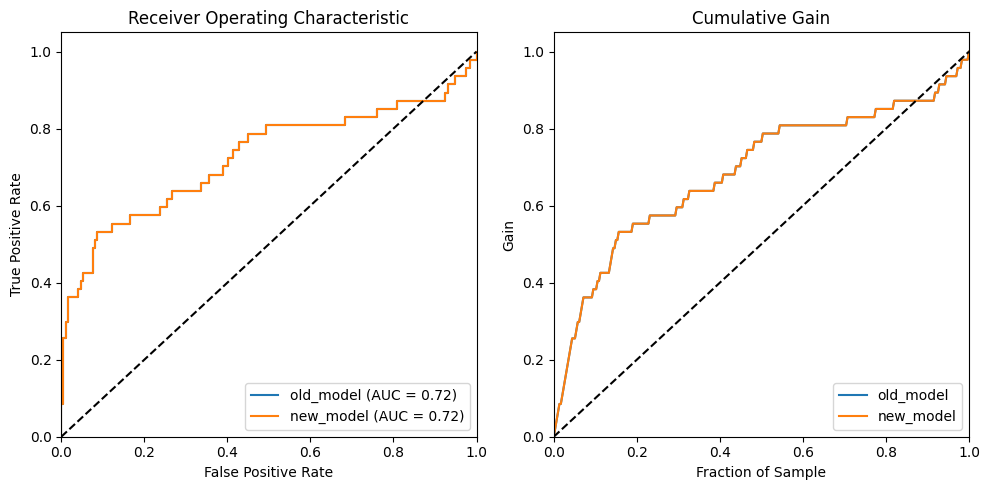

[-1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4653061224489796, -1.4979591836734694, -1.573469387755102, -1.5653061224489795, -1.6408163265306122, -1.569387755102041, -1.457142857142857, -1.4285714285714284, -1.3265306122448979, -1.3489795918367344, -1.3387755102040815, -1.287755102040816, -1.2061224489795914, -1.197959183673469, -1.1061224489795916, -1.004081632653061, -0.9224489795918365, -0.7897959183673466, -0.7714285714285711, -0.7102040816326529, -0.7224489795918367, -0.7877551020408162, -0.8428571428571427, -0.8571428571428569, -0.7857142857142856, -0.789795918367346

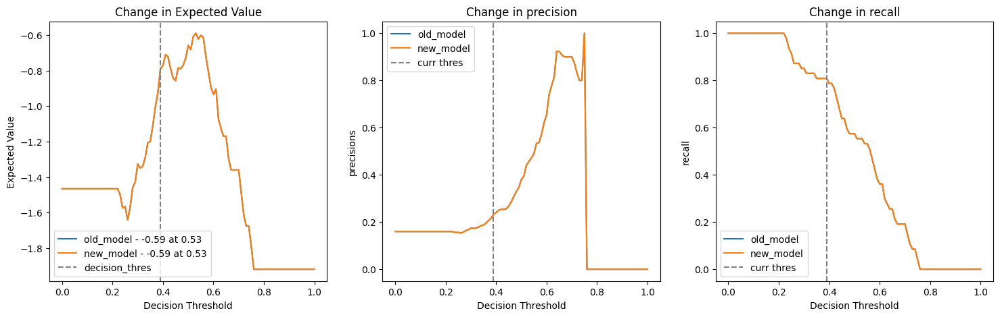

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores, decision_thres=0.39, verbose=True)

# Model Selection for CBM3

[[ -0.6 -12. ]\
[ -3. 0. ]]

## Training

In [ ]:
## seems like confusion amtrix is defined with first row as true attrition and second row as true no attrition
cbm = cbm3
print(cbm)
#best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_trial) # use this is just wna test code
best_models = grid_search(X_train, y_train, X_test, y_test, cbm, grids_full) # use this for actl HP tuning

[[ -0.6 -12. ]
 [ -3.    0. ]]
grid searching.... LogisticRegression(max_iter=1000)
Time taken= 0.617mins

grid searching.... SVC(max_iter=6000, probability=True)
Time taken= 0.154mins

grid searching.... KNeighborsClassifier()
Time taken= 0.032mins

grid searching.... DecisionTreeClassifier(random_state=2023)
Time taken= 0.052mins

grid searching.... GradientBoostingClassifier(max_depth=1, random_state=2023)
Time taken= 2.181mins

grid searching.... RandomForestClassifier(n_estimators=500, random_state=2023)
Time taken= 4.884mins


fitting tuned model.... LR

Expected value of best model= -1.2469387755102042
Set of hyperparameters: {'C': 1.4444444444444444, 'penalty': 'none'}
              precision    recall  f1-score   support

        True       0.60      0.45      0.51        47
       False       0.90      0.94      0.92       247

    accuracy                           0.86       294
   macro avg       0.75      0.70      0.72       294
weighted avg       0.85      0.86      0.8

In [ ]:
## Visualising performance
all_scores = {}
for model_key in best_models.keys():
  # best_models[model_key].fit(X_train, y_train)
  y_score = best_models[model_key].predict_proba(X_test)[:,1]
  all_scores[model_key] = y_score

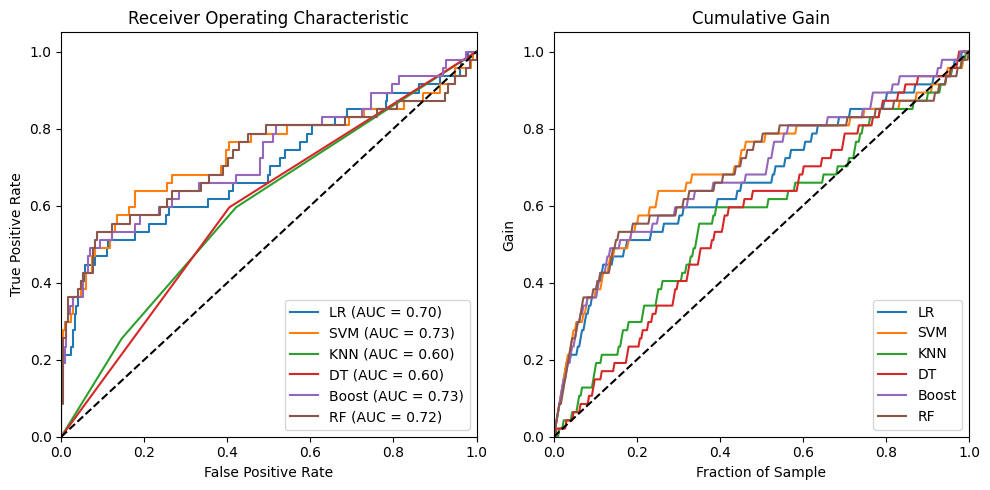

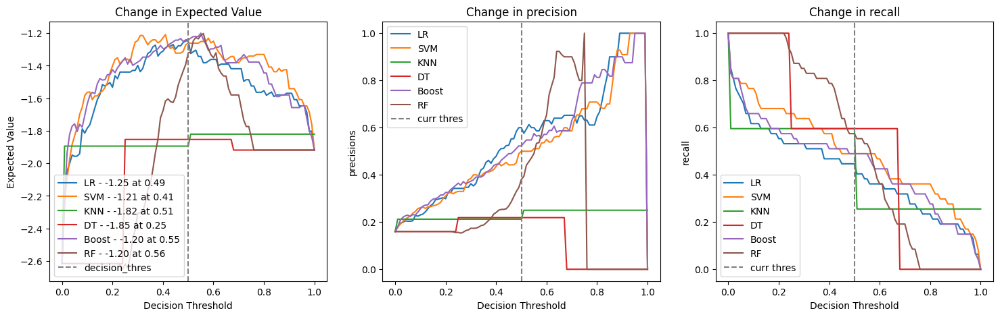

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores)

In [ ]:
# best_model = best_models['SVM']
# best_model = best_models['LR']
# best_model = best_models['Boost']
best_model = best_models['RF']

# best_model.fit(X_train, y_train)

## Recursive Feature Elimination (RFE) 
First cell is the tuning of num features while second cell is manual training based on optimal feature

Optimal number of features: 62
Selected features: Index(['Age_Boomers', 'Age_Generation X', 'Age_Millenials',
       'Department_Human Resources', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'Gender_Female', 'Gender_Male',
       'JobRole_Healthcare Representative', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'JobRole_Sales Representative', 'MaritalStatus_Divorced',
       'MaritalStatus_Married', 'MaritalStatus_Single', 'OverTime_No',
       'OverTime_Yes', 'AgeMartial_Boomers_Divorced',
       'AgeMartial_Boomers_Married', 'AgeMartial_Boomers_Single',
       'AgeMartial_Generation X_Divor

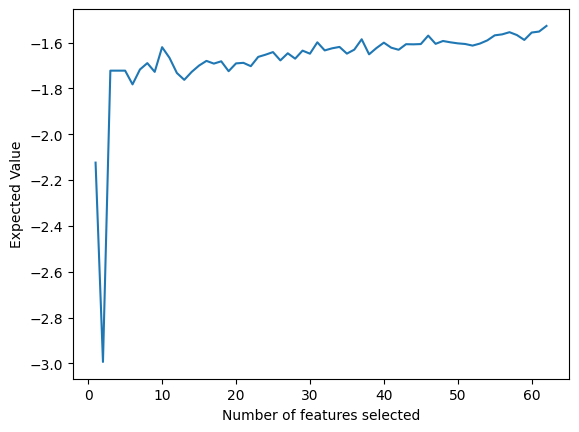

In [ ]:
# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5)

# Instantiate the RFECV object
rfecv = RFECV(best_model, step=1, cv=cv, scoring=make_scorer(expected_value_fn, cost_benefit_matrix=cbm))

# Fit RFECV on the training data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_num_features = rfecv.n_features_
print("Optimal number of features:", optimal_num_features)

# Get the selected features
selected_features_idx = np.where(rfecv.support_)[0]
drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
selected_features = X_train.columns[selected_features_idx]
drop_features =  X_train.columns[drop_features_idx] 
print("Selected features:", selected_features)
print("Drop features:", drop_features)

# Transform the data to keep only the selected features
X_train_selected = rfecv.transform(X_train)
X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
X_test_selected = rfecv.transform(X_test)
X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

best_model.fit(X_train, y_train)
y_test_pred = best_model.predict(X_test)
print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# Train and evaluate the model using the selected features
best_model.fit(X_train_selected, y_train)
y_test_pred = best_model.predict(X_test_selected)

print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Expected Value")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()


In [ ]:
# # Instantiate the RFE object
# num_features_to_select = 31  # Specify the number of top features to select
# rfe = RFE(best_model, n_features_to_select=num_features_to_select, step=1)

# # Fit RFE on the training data
# rfe.fit(X_train, y_train)

# # Get the selected features
# selected_features_idx = np.where(rfe.support_)[0]
# drop_features_idx = [i for i in range(X_train.shape[1]) if i not in selected_features_idx]
# selected_features = X_train.columns[selected_features_idx]
# drop_features =  X_train.columns[drop_features_idx] 
# print("Selected features:", selected_features)
# print("Drop features:", drop_features)

# # Get the feature ranking
# feature_ranking = rfe.ranking_
# feature_ranking_idx = feature_ranking.argsort()
# for f_idx in feature_ranking_idx:
#   ranking = feature_ranking[f_idx]
#   feature = X_train.columns[f_idx]
#   drop = '' if ranking == 1 else 'dropped'
#   print(f'Feature {feature} --- rank {ranking} {drop}')

# # Transform the data to keep only the selected features
# X_train_selected = rfe.transform(X_train)
# X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)
# X_test_selected = rfe.transform(X_test)
# X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)

# best_model.fit(X_train, y_train)
# y_test_pred = best_model.predict(X_test)
# print("[BEFORE] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

# # Train and evaluate the model using the selected features
# best_model.fit(X_train_selected, y_train)
# y_test_pred = best_model.predict(X_test_selected)

# print("[AFTER] Model score on test data:", expected_value_fn(y_test, y_test_pred, cbm))

### Feature Importance post feature selection

Feature ranking:
1. feature 1 (0.037745): Age_Generation X
2. feature 46 (0.042236): YearsAtCompany
3. feature 25 (0.047188): MaritalStatus_Single
4. feature 44 (0.051612): TotalWorkingYears
5. feature 40 (0.058422): MonthlyIncome
6. feature 2 (0.062871): Age_Millenials
7. feature 26 (0.091084): OverTime_No
8. feature 27 (0.100069): OverTime_Yes
9. feature 55 (0.106059): JobLevel
10. feature 59 (0.140328): StockOptionLevel


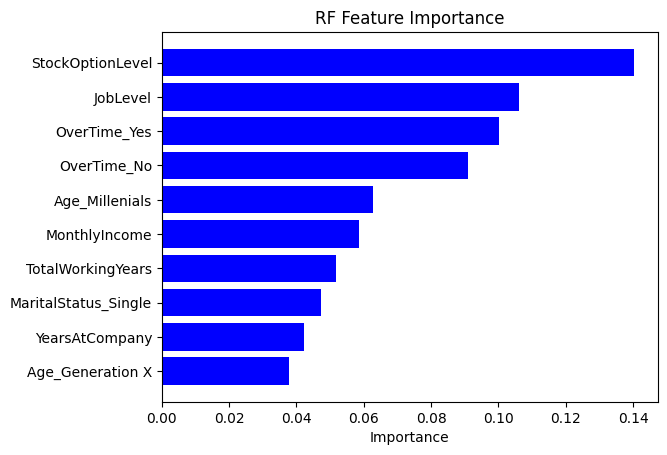

In [ ]:
rf_feat_wrapper(best_model, X_train_selected, y_train) ## Only if best model is RF

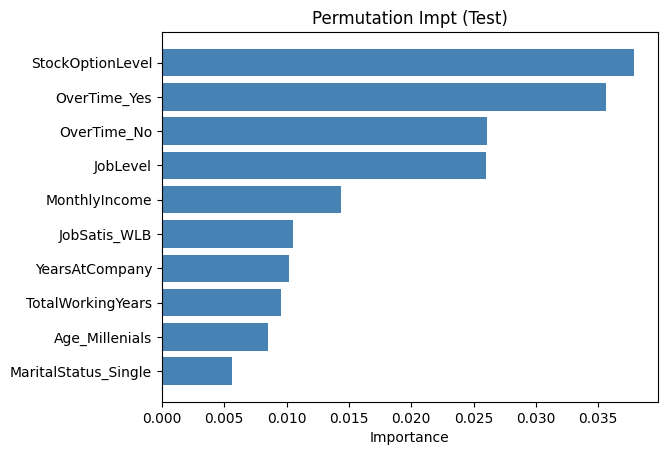

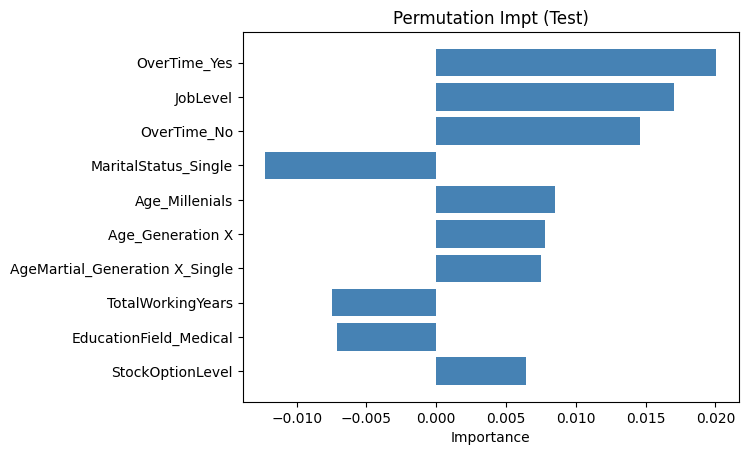

In [ ]:
best_model.fit(X_train_selected, y_train)
permutation_wrapper(best_model, X_train_selected, y_train, title='Test')
permutation_wrapper(best_model, X_test_selected, y_test, title='Test')

## Final Performance Evaluation

In [ ]:
all_scores = {}
models = {'old_model': [X_train, X_test], 
          'new_model': [X_train_selected, X_test_selected]}

for name, (X_train_in, X_test_in) in models.items():
  best_model.fit(X_train_in, y_train)
  y_scores = best_model.predict_proba(X_test_in)[:,1]
  all_scores[name] = y_scores

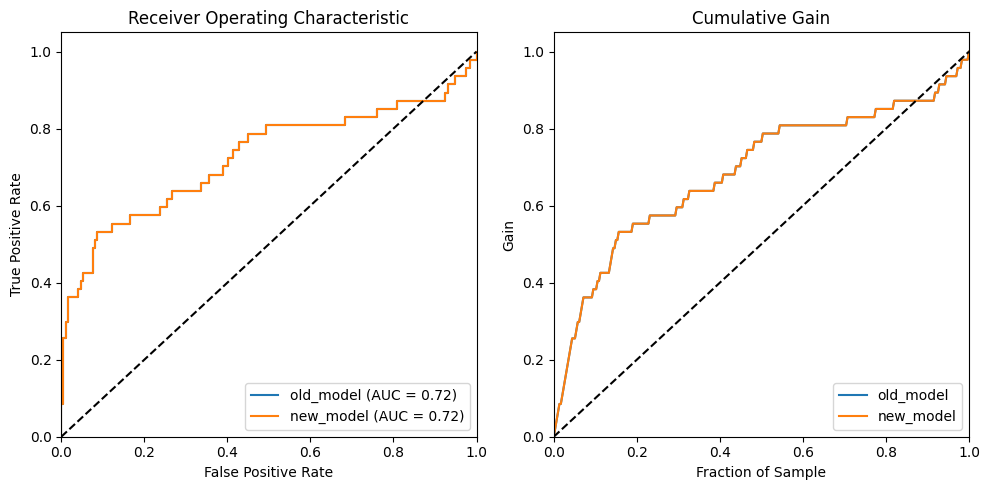

[-2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.616326530612245, -2.6244897959183673, -2.6510204081632653, -2.6183673469387756, -2.644897959183673, -2.573469387755102, -2.461224489795918, -2.4081632653061225, -2.306122448979592, -2.304081632653061, -2.293877551020408, -2.242857142857143, -2.1612244897959183, -2.1285714285714286, -2.036734693877551, -1.9346938775510205, -1.853061224489796, -1.720408163265306, -1.6775510204081632, -1.616326530612245, -1.6040816326530614, -1.620408163265306, -1.6265306122448981, -1.5918367346938775, -1.5204081632653061, -1.4755102040816326, -1.4326530612244899, -1.39

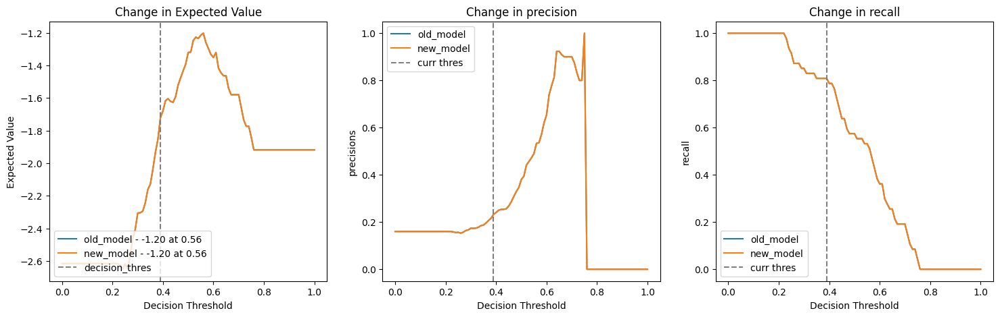

In [ ]:
plot_roc_and_gain(all_scores)
plot_ev(all_scores, decision_thres=0.39, verbose=True)

# Results:
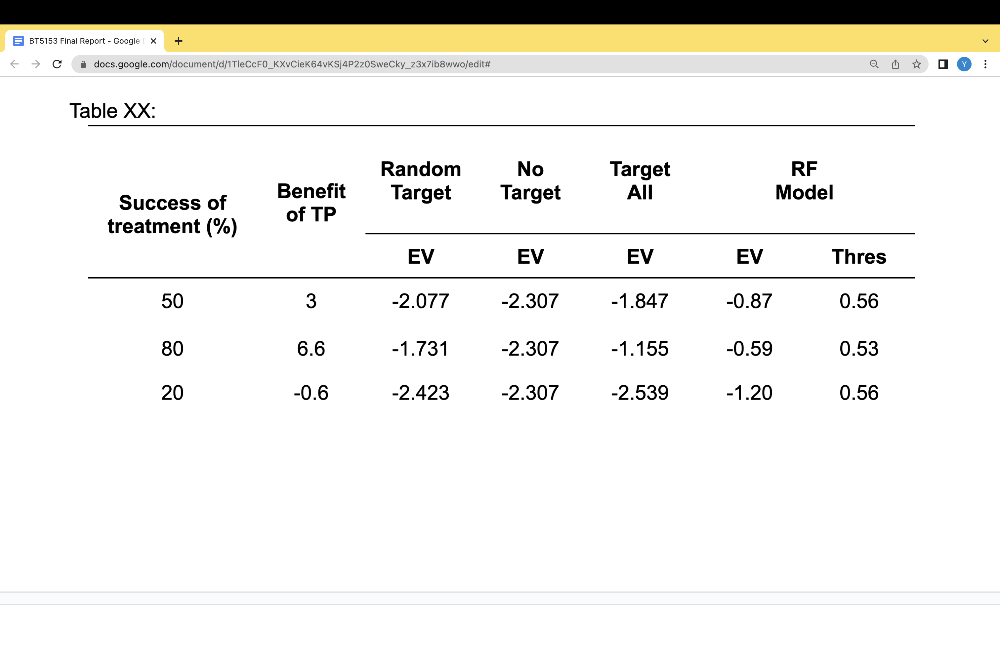

# Lime Example for Display
All test data has been analysed with LIME. LIME explanations were further processed for this dashboard created at \
https://attrition-analytics.herokuapp.com/

## Obtaining raw and processed data. Raw data will be displayed as it is interpretable (x_test_raw) and processed data is fed for lime (x_test_limeuse)

In [ ]:
X_test_idx = X_test_temp.index
X_test_raw = X_test_temp.reset_index(drop=True)
X_test_limeuse = X_test_selected.reset_index(drop=True)
y_test_prob = best_model.predict_proba(X_test_limeuse)
X_test_limeuse['EmployeeID'] = X_test_idx
X_test_raw['EmployeeID'] = X_test_idx

In [ ]:
y_test_pred = pd.DataFrame(np.argmax(y_test_prob, axis=1).reshape(-1,1), columns=['Pred_Attrition'])
y_test_pred['Pred_Attrition_Prob'] = y_test_prob[:,1].reshape(-1,1)
y_test_df = pd.DataFrame(y_test, columns=['Attrition'])
df_pred = pd.concat([X_test_raw, y_test_df, y_test_pred], axis=1)
df_pred = df_pred.sort_values('Pred_Attrition_Prob',ascending=False)
df_pred

,Age,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,FirstJob,JobHopIndex,TenureRatio,MonthlyIncomeInJobLevel,MonthlyIncomeInJobRole,JobSatis_WLB,EmployeeID,Attrition,Pred_Attrition,Pred_Attrition_Prob
126,Millenials,Travel_Rarely,Sales,21,3,Other,4,Male,2,1,...,0,1.000000,1.000000,0.794382,0.822412,5,688,1,1,0.780019
265,Millenials,Travel_Frequently,Sales,1,1,Technical Degree,1,Female,2,1,...,0,3.000000,1.000000,0.814232,0.842962,4,357,1,1,0.776772
260,Millenials,Travel_Rarely,Sales,5,3,Marketing,4,Female,3,1,...,0,1.000000,1.000000,1.067790,1.105467,6,363,1,1,0.774333
76,Millenials,Travel_Rarely,Research & Development,7,1,Life Sciences,4,Male,3,1,...,0,1.000000,1.000000,0.925843,0.856104,4,1339,1,1,0.757396
284,Millenials,Travel_Rarely,Research & Development,5,3,Life Sciences,3,Female,3,1,...,0,4.000000,1.000000,0.928090,0.858182,3,318,0,1,0.752860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Generation X,Non-Travel,Research & Development,14,4,Technical Degree,3,Male,3,2,...,0,2.000000,0.500000,1.023783,1.893333,5,1370,0,0,0.208328
259,Generation X,Travel_Rarely,Research & Development,25,2,Medical,3,Female,2,2,...,0,1.285714,0.666667,1.073221,0.841433,7,832,0,0,0.206643
164,Generation X,Travel_Frequently,Research & Development,7,2,Medical,3,Male,2,5,...,0,21.000000,1.000000,1.002080,1.104128,7,326,0,0,0.206461
135,Generation X,Travel_Rarely,Research & Development,1,1,Life Sciences,4,Female,2,4,...,0,21.000000,1.000000,0.788783,1.976423,7,738,0,0,0.205630


In [ ]:
df_pred_json = df_pred.copy(deep=True)
df_pred_json['Pred_Attrition_Prob'] = df_pred_json['Pred_Attrition_Prob']*100
df_pred_json.to_json('index_data.json', orient="records")

## Converting LIME Explainations to readable format for all data

In [ ]:
# Assuming 'model' is your trained classifier and 'vectorizer' is your text vectorizer
def predict_proba(data):
    return best_model.predict_proba(data)

def split_expression(expression):
    # Define a pattern for splitting the expression
    pattern = r"([<>]=?)"  # This pattern will match '<', '>', '<=', or '>='
    
    # Split the expression using the pattern
    split_result = re.split(pattern, expression)
    
    # Remove any whitespace from the split_result
    split_result = [part.strip() for part in split_result]
    
    return split_result
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train_selected), feature_names=X_train_selected.columns, class_names=['No Attrition', 'Attrition'])
columns = X_test_limeuse.columns

all_employee_result = {}

for idx in range(X_test_limeuse.shape[0]):

  instance = X_test_limeuse.iloc[idx]
  id = int(instance['EmployeeID'])
  df_pred_row = df_pred[df_pred['EmployeeID']==id]

  id = str(id)
  instance.drop('EmployeeID', inplace=True)

  ## Processing Explanation to give Feature and Weight based on processed X
  explanation = explainer.explain_instance(instance, predict_proba)
  output_rows = {} #keys are features, [0, 1], 0: value, 1:weight
  exp_map = explanation.as_map()
  exp_val = list(exp_map.values())[0]

  for (f_idx, weight) in exp_val:
    word = columns[f_idx]
    feature = ''
    is_cat = False
    for cat in cat_cols:
      if cat in word:
        feature = cat
        is_cat = True
    if not is_cat:
      feature = word

    weighted_prob =  weight
    feature_val = df_pred_row[feature].values[0]
        
    if not feature in output_rows:
      output_rows[feature] = [feature_val, weighted_prob]
    else:
      existing_val = output_rows[feature]
      existing_val[1] = existing_val[1] + weighted_prob
      output_rows[feature] = existing_val


  prob = predict_proba(np.array(instance).reshape(1,-1))
  stay_prob, leave_prob  = prob[0][0], prob[0][1]

  ## Saving result to dict to parse as json later

  employee_result = []
  for key, val in output_rows.items():
    employee_feature = {}
    employee_feature["Feature"] = key
    if type(val[0]) == str:
      employee_feature["Value"] = val[0]
    elif isinstance(val[0], np.int64):
      employee_feature["Value"] = int(val[0])
    elif isinstance(val[0], np.float64):
      employee_feature["Value"] = float(val[0])
    else:
      print(type(val[0]))
    employee_feature["Weight"] = abs(val[1])
    employee_feature["Attrition"] = "stay" if val[1] < 0 else "leave"
    employee_result.append(employee_feature)

  employee_feature = {}
  employee_feature["Feature"] = 'TOTAL'
  employee_feature["Value"] = stay_prob
  employee_feature["Weight"] = leave_prob
  employee_feature["Attrition"] = "stay" if stay_prob > leave_prob else "leave"
  employee_result.append(employee_feature)
  all_employee_result[id] = employee_result

json_data = json.dumps(all_employee_result, ensure_ascii=False)
print(json_data)
# Write JSON string to file
with open("result.json", "w") as outfile:
    outfile.write(json_data)

{"569": [{"Feature": "StockOptionLevel", "Value": 0, "Weight": 0.13870093778363177, "Attrition": "leave"}, {"Feature": "OverTime", "Value": "No", "Weight": 0.13358354755863264, "Attrition": "stay"}, {"Feature": "JobLevel", "Value": 3, "Weight": 0.06554987618102419, "Attrition": "stay"}, {"Feature": "Age", "Value": "Millenials", "Weight": 0.05195617366740778, "Attrition": "leave"}, {"Feature": "MonthlyIncome", "Value": 7587, "Weight": 0.025841482128616367, "Attrition": "stay"}, {"Feature": "MaritalStatus", "Value": "Single", "Weight": 0.025064929483244024, "Attrition": "leave"}, {"Feature": "AgeMartial", "Value": "Millenials_Single", "Weight": 0.038858084587327694, "Attrition": "leave"}, {"Feature": "TOTAL", "Value": 0.49622184525717317, "Weight": 0.5037781547428268, "Attrition": "leave"}], "577": [{"Feature": "JobLevel", "Value": 1, "Weight": 0.1011343115903393, "Attrition": "leave"}, {"Feature": "StockOptionLevel", "Value": 2, "Weight": 0.08863186392509668, "Attrition": "stay"}, {"Fea